In [6]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import yt

In [3]:
yt.funcs.mylog.setLevel(50) #coerce output null

Need to fix units to system G=1

G=1 Ramses setting was that I also need to specify the length, density and time scaling factor that lets me convert from that unit system to cgs. So that part should be all fixed now. 

remember to change things in the makefile to :

In [5]:
# !module load yt

In [8]:
rmax = 1.0e10
def plot_all():
    ds= yt.load("../../bin/output_00001/info_00001.txt")
    proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
    proj.set_cmap("density","rainbow")
    proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                      circle_args={'color':'black'})
    proj.annotate_velocity()
    proj.show()
    ds= yt.load("../../bin/output_00002/info_00002.txt")
    proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
    proj.set_cmap("density","rainbow")
    proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                      circle_args={'color':'black'})
    proj.annotate_velocity()
    proj.show()


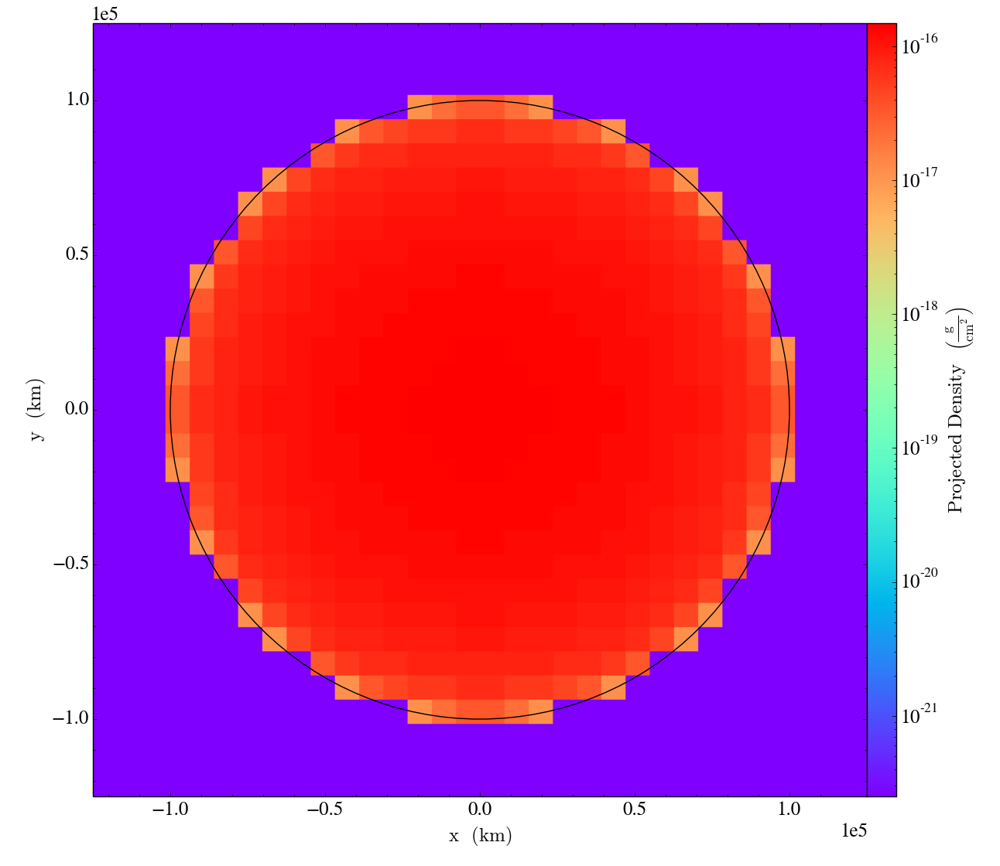


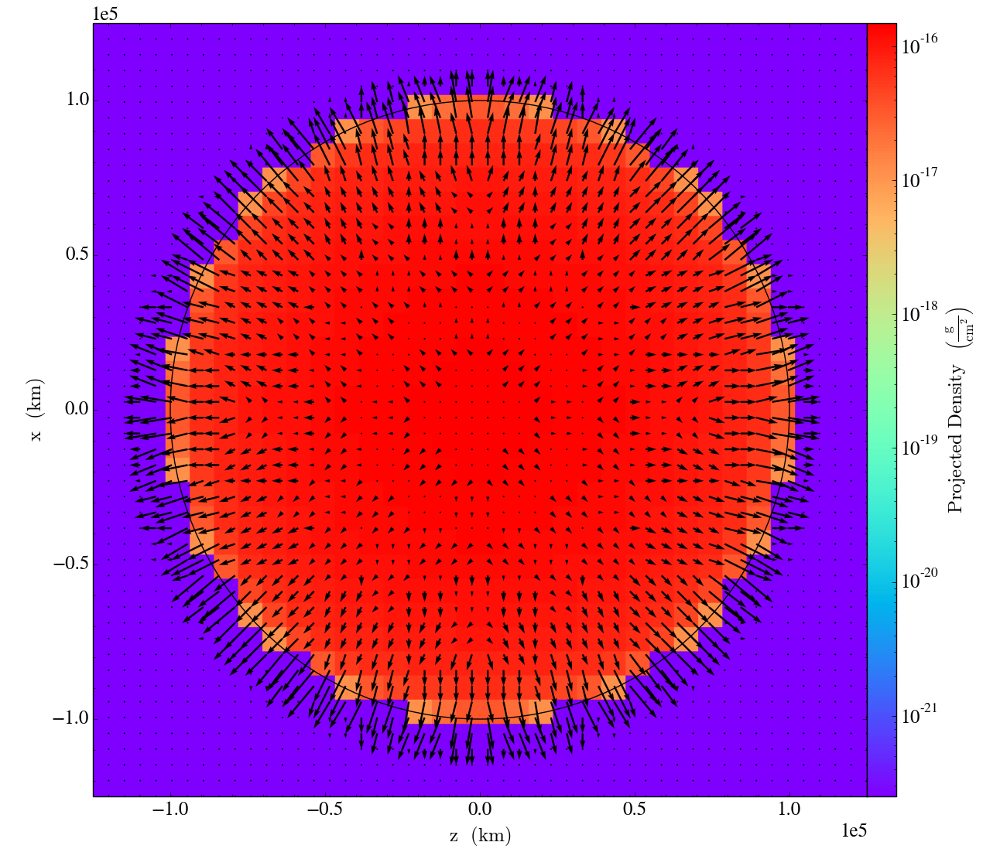

In [8]:
plot_all()

I am not sure why make -j doesn't work with gnu compilers? It crashes everytime I do make -j on ramses? 

Set pressure as P0 everywhere and let it do its own thing'


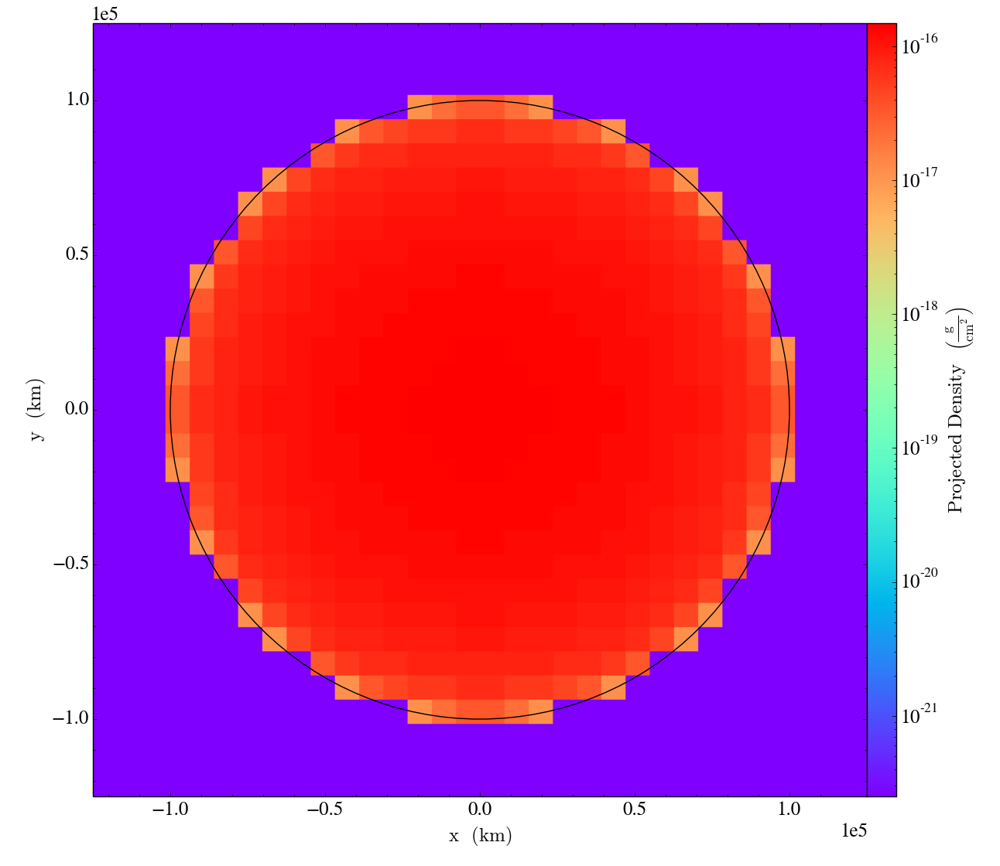


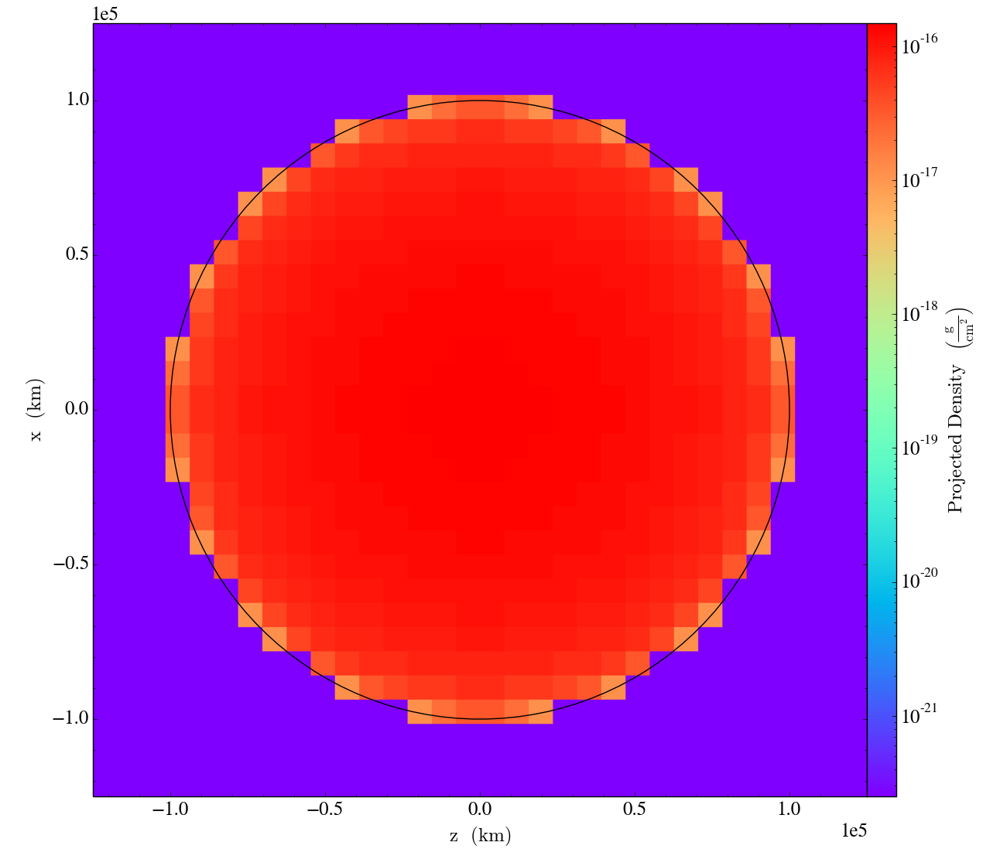

In [11]:
plot_all()


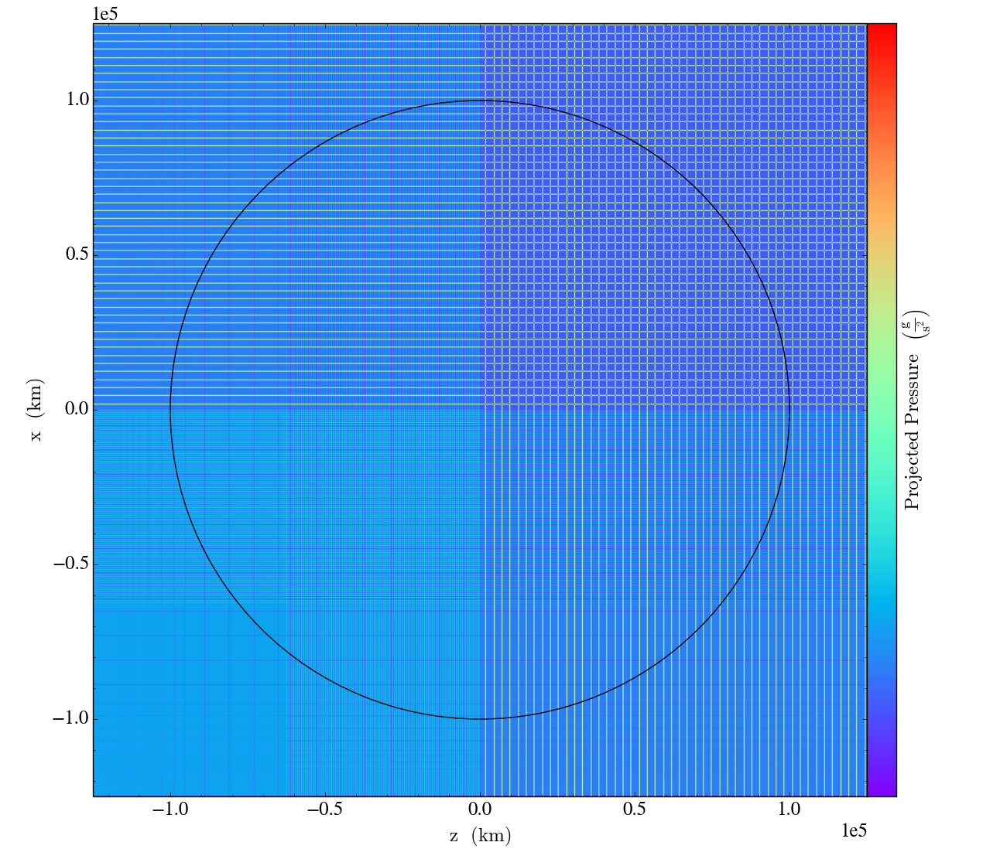

In [13]:
ds= yt.load("../../bin/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "pressure",window_size=10)
proj.set_cmap("pressure","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()

There seems to be a function called velana that I could specify the analytical form of the velocity. However this is only called for the MHD runs : 

in courant_fine.f90
```
! Impose analytical velocity field
        call velana(xx,vv,dx_loc,t,ngrid)
```

Also this looks like it sets up I.C. and not for all t. 

I'm curious to what the coeur/ looks like:


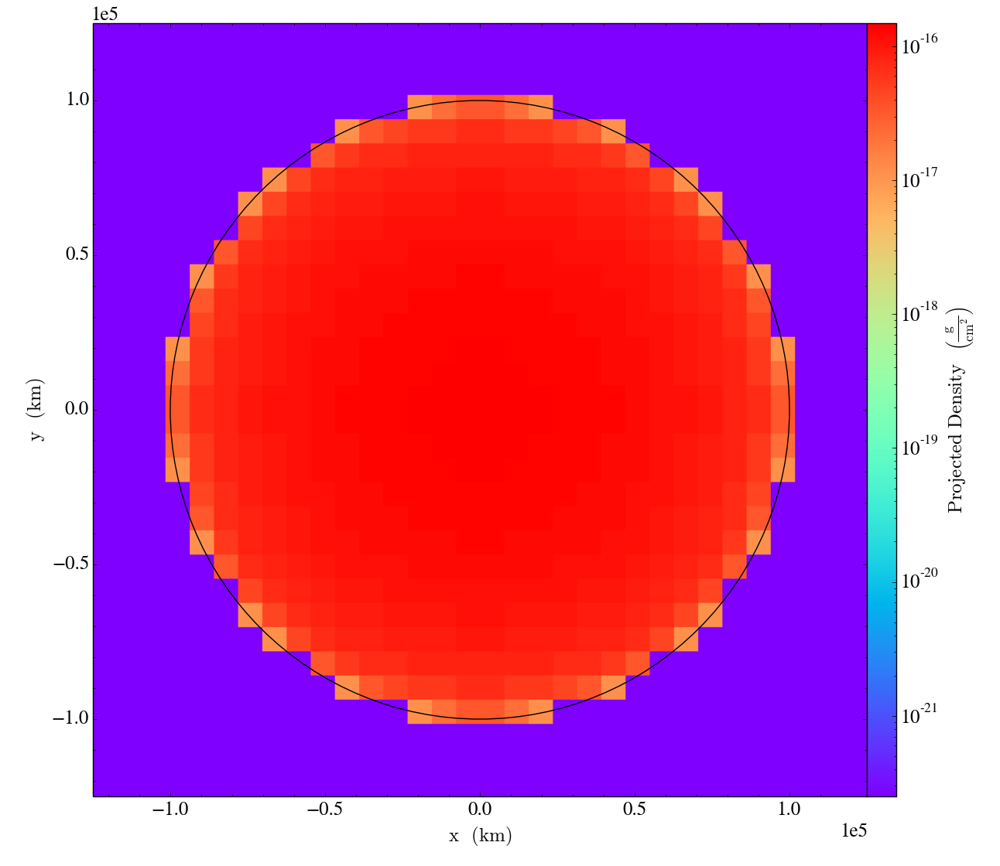


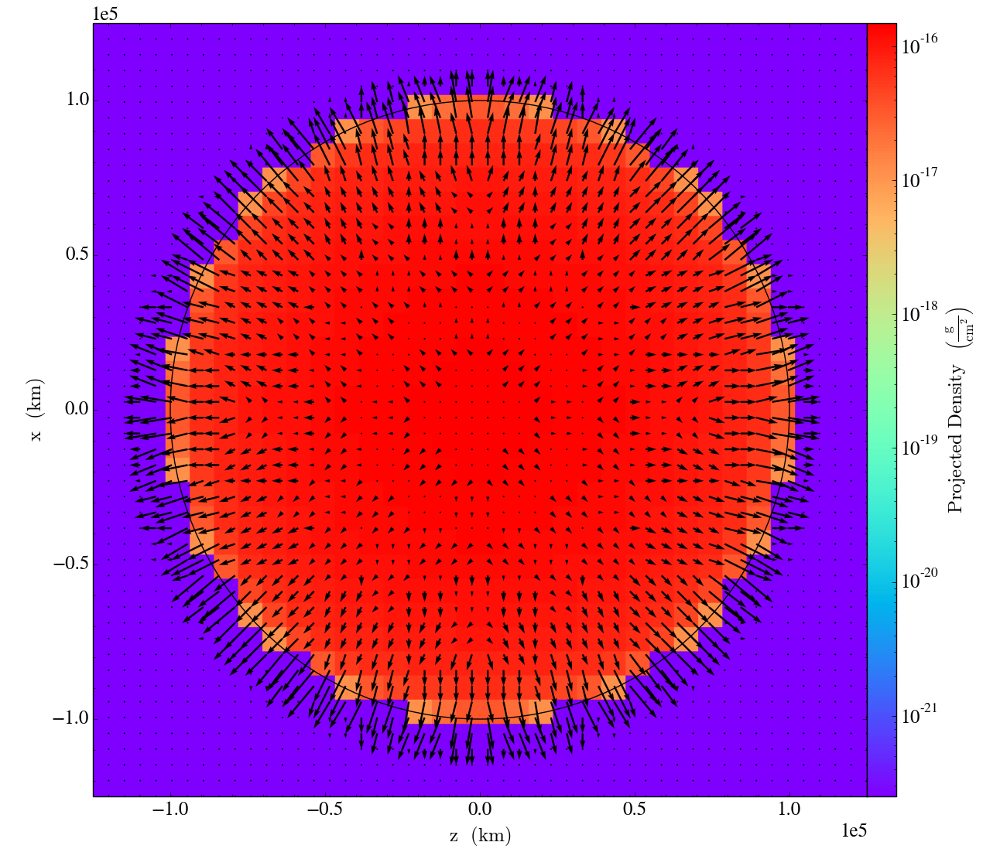

In [14]:
plot_all()

As I expected it didn't do anything because this function is not called by ramses. What if I compile using MHD and just set B=0? 

In [15]:
plot_all()

fmt = '=d' ; length = 1046112767 ; size= 8


RuntimeError: 

MHD is weird I guess this is the smae yt output I get for 2D RAMSES on yt which is not supported..

I did not turn on self gravity


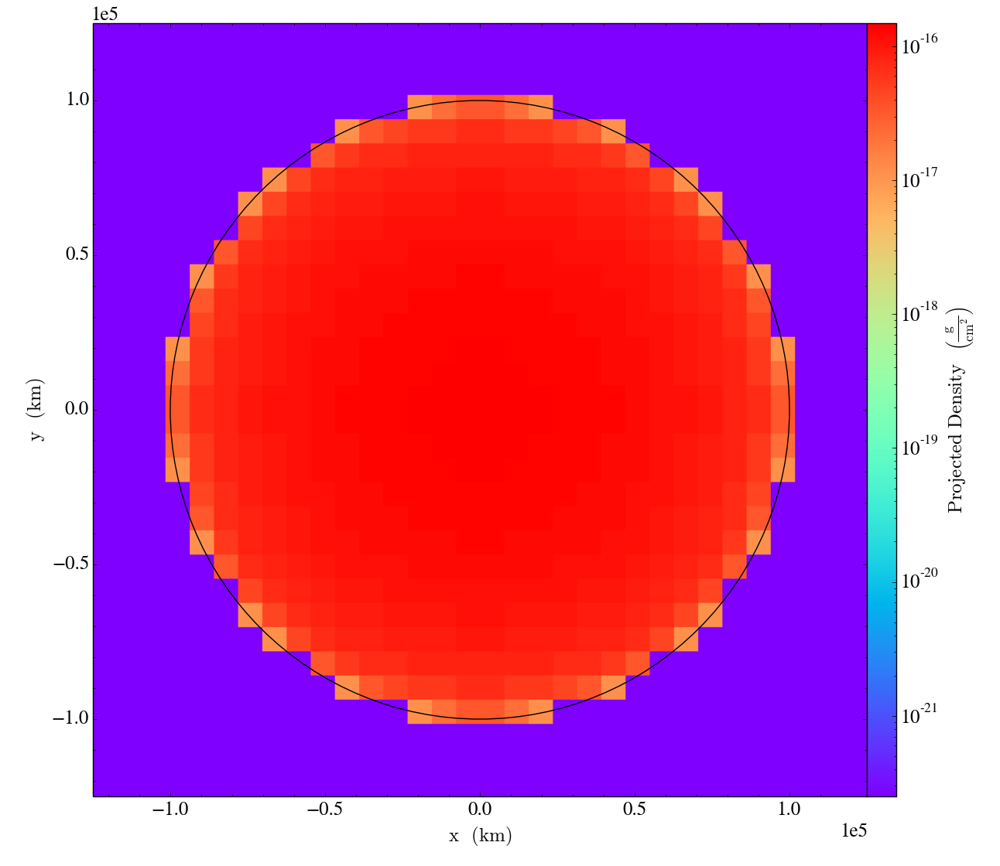


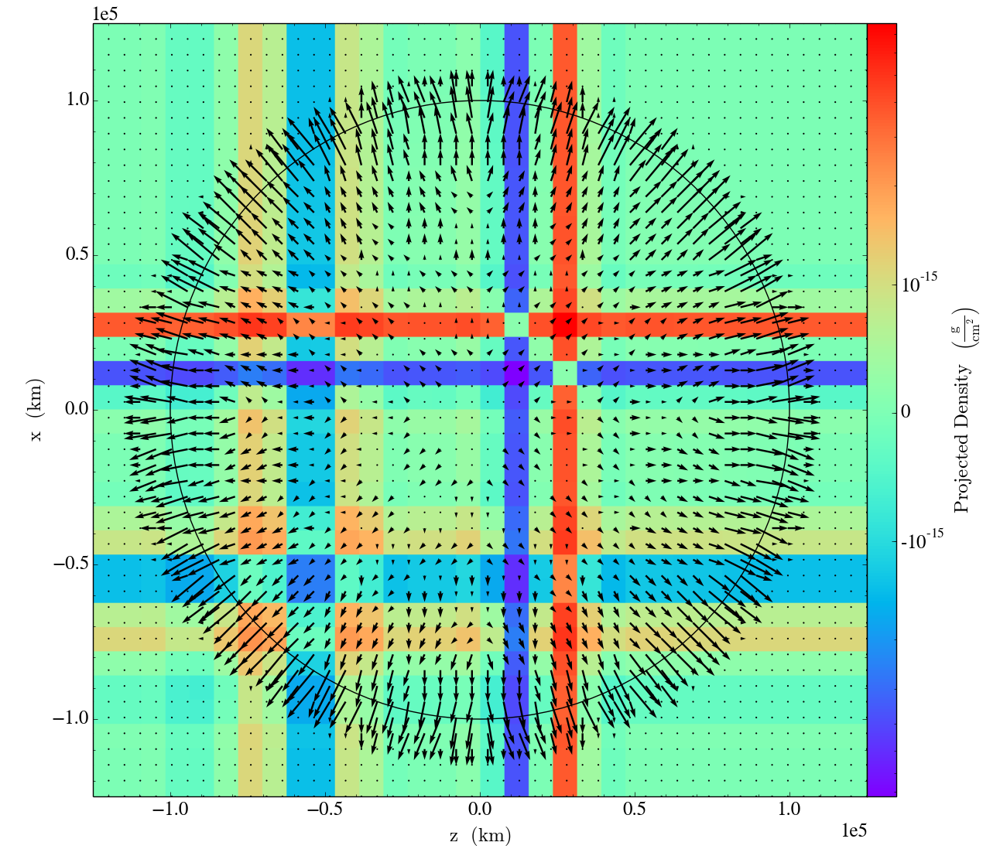

In [17]:
plot_all()

"Initially there are no pressure gradients in the cloud, so the whole cloud begins to colapse in free fall"(Larson 1969)

Again, settign P=P0 where P0 was supposedly calculated by the ideal gas law equation 


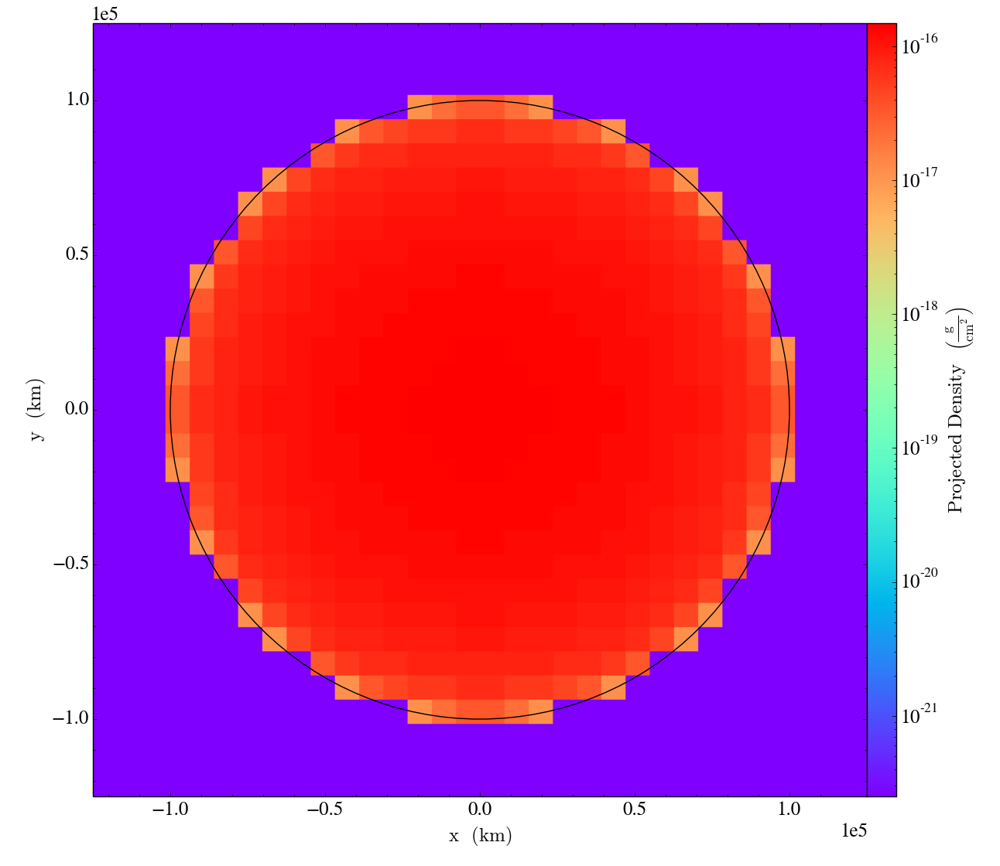


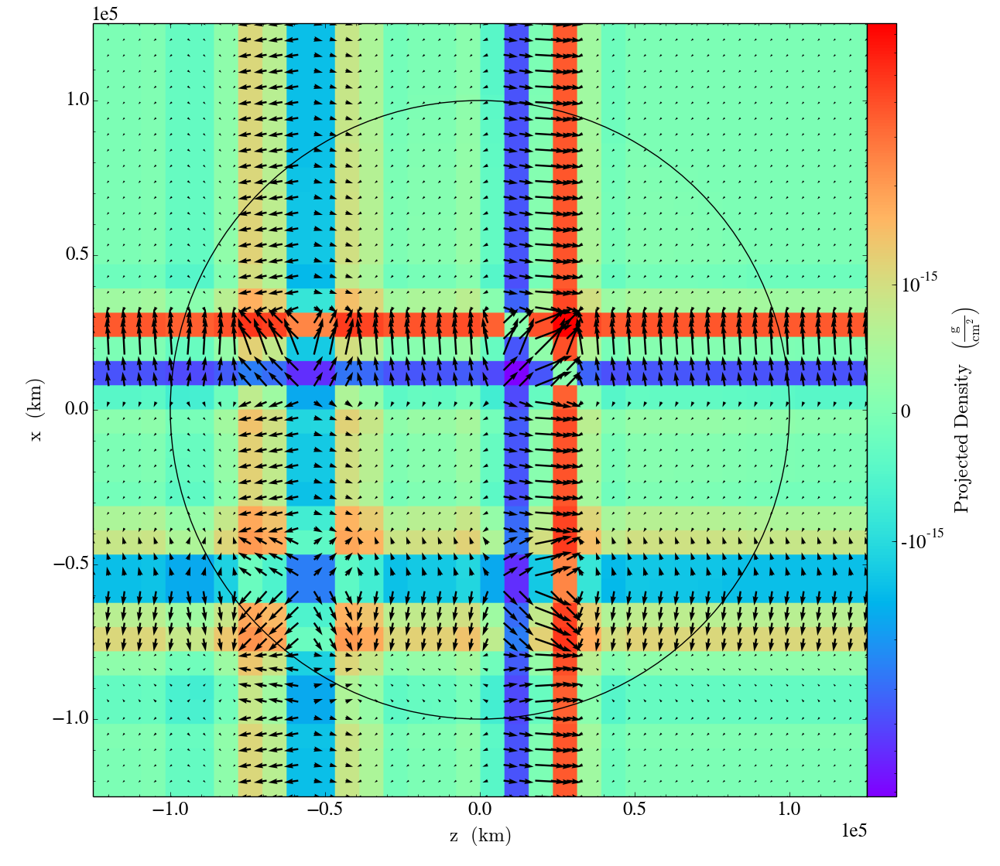

In [18]:
plot_all()

WARN: Fine multigrid Poisson failed to converge...

G=1 Ramses setting was that I also need to specify the length, density and time scaling factor that lets me convert from that unit system to cgs. So that part should be all fixed now. 

From the manual
```
This very simple routine can be found in directory amr/ and is called units.f90. It is used to set the conversion factors from the user units into the cgs unit system. In this routine, the user must provide 3 scaling factors, namely scale_d for the density units in g.cm−3, scale_l for the length scale in cm and scale_t for the time scale in seconds. For self-gravity runs, since RAMSES assumes G = 1 in the Poisson equation, it is mandatory to define the time scale as scale_t=1.0/sqrt(G*scale_d) with G=6.67d-8. These scaling factors are stored in the output files and can be used later on during post-processing.
```

legnth_x = 350000000000000000.0 =length_y=length_z

boxlen=25000000000

In [ ]:
scale_d= 

In [21]:
G = 6.67e-8
scale_t=1.0/sqrt(G*scale_d) 

NameError: name 'scale_d' is not defined


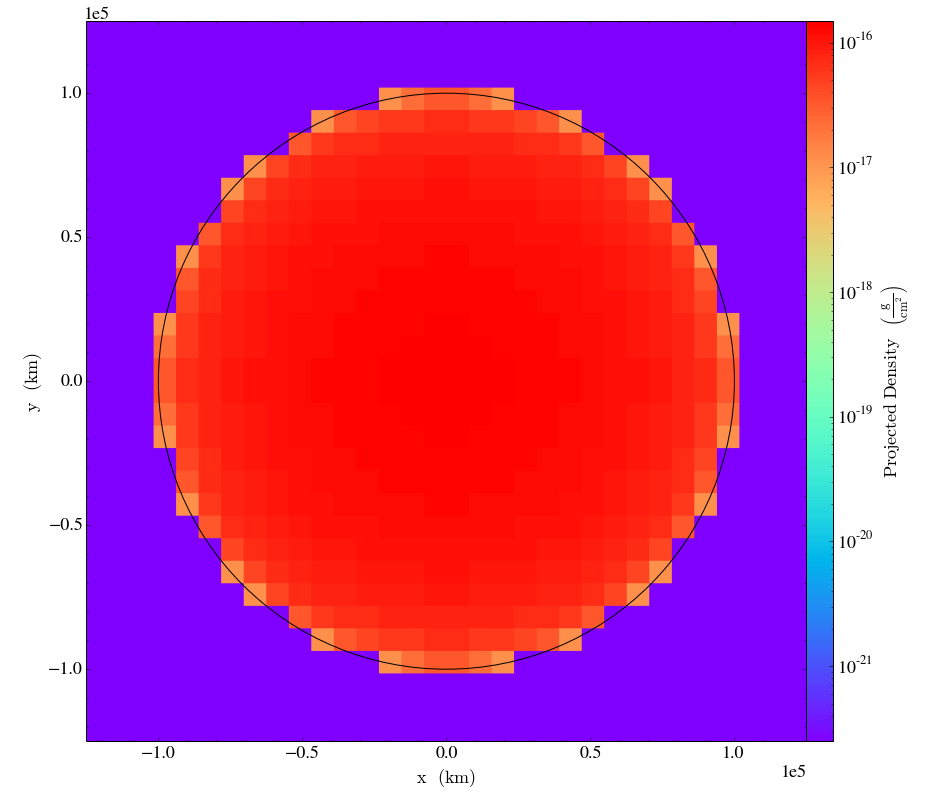


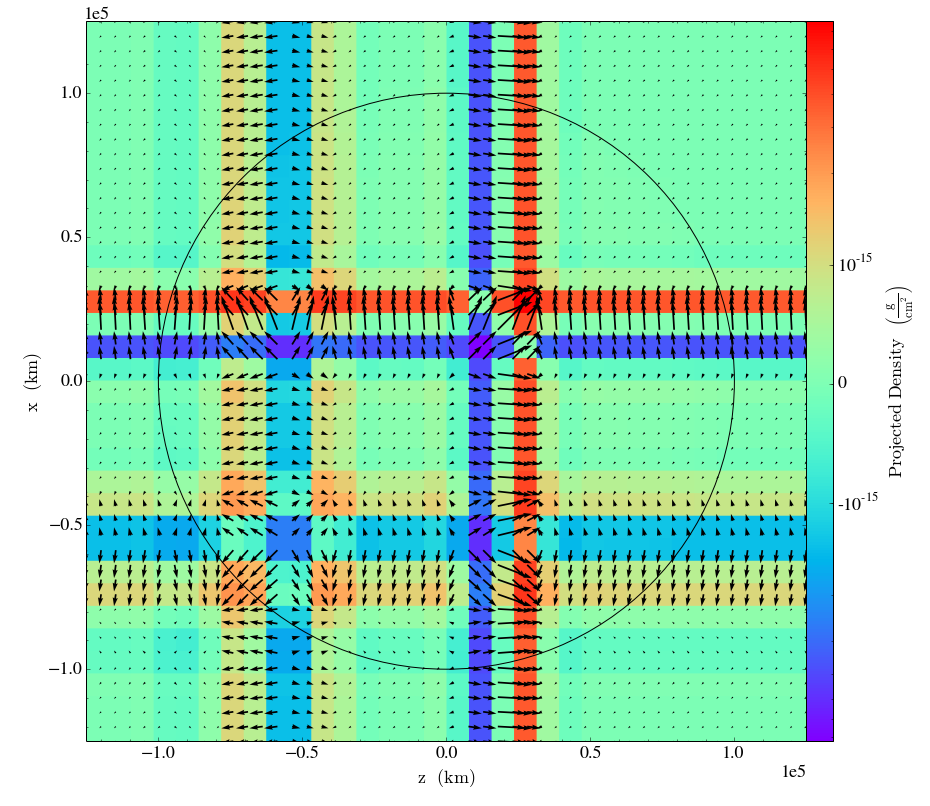

In [22]:
plot_all()

the scaling factor didn't seem to do anything to the simulation..'

Make P~0 everywhere


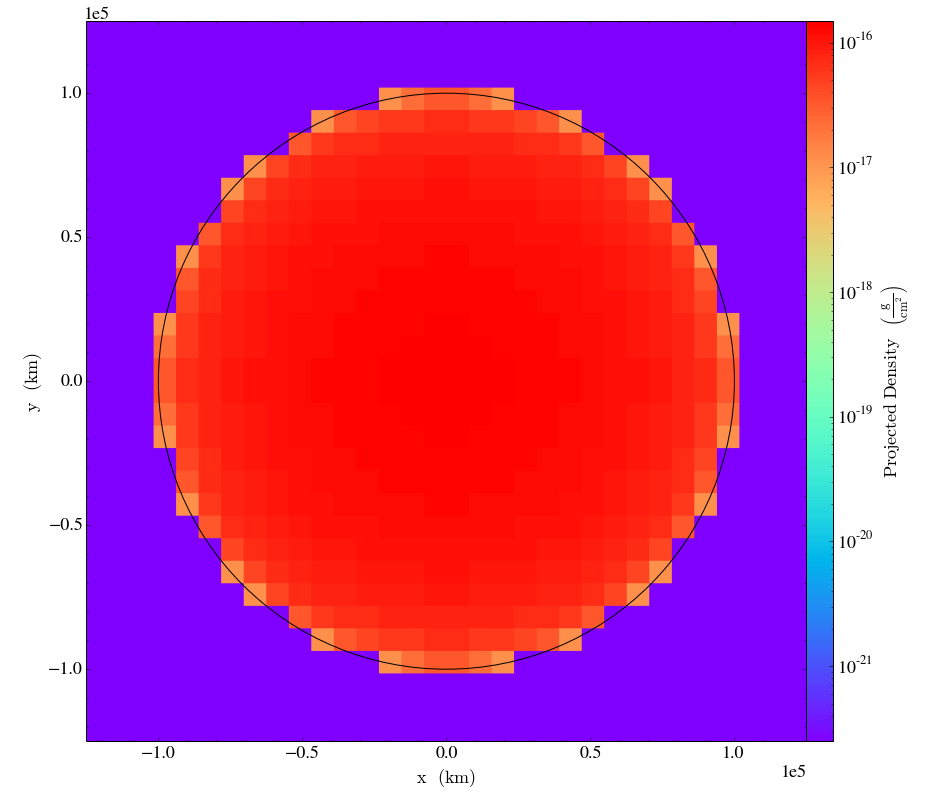


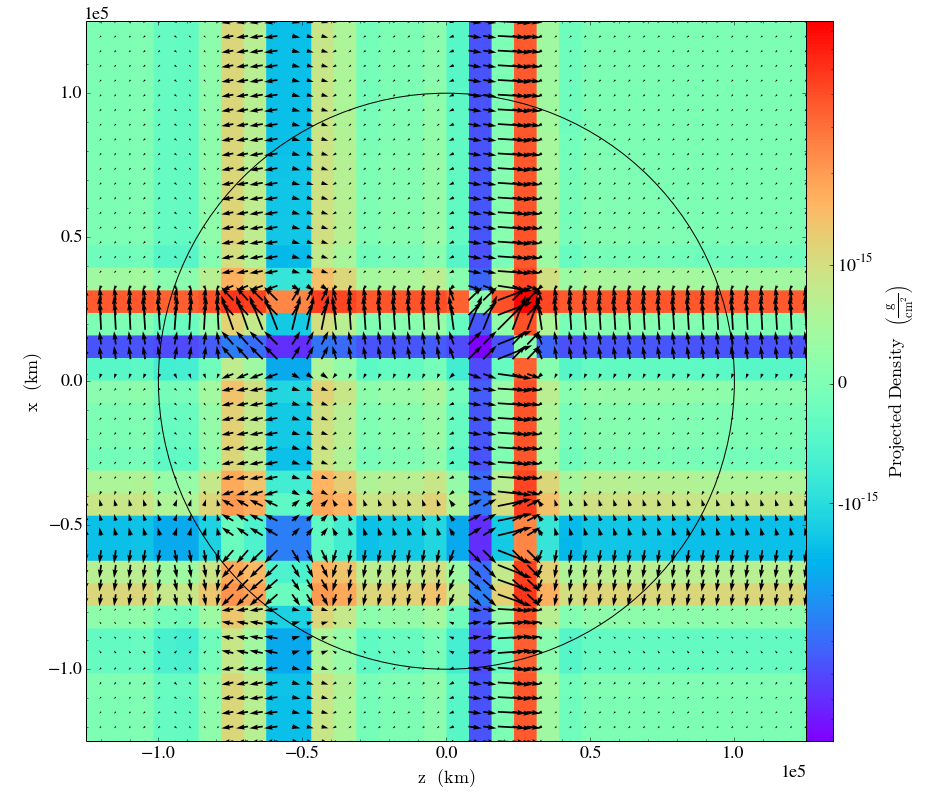

In [25]:
plot_all()

Be careful if you have space in your Makefile Paths or things like that because the program might crash when compiling with an extra space in the string.

Modified the Boundary condition so that it is an outflow B.C. so that there wouldn't be a buildup of pressure gradient. (default was periodic)

In [38]:
plot_all()

ValueError: could not broadcast input array from shape (0) into shape (4096)


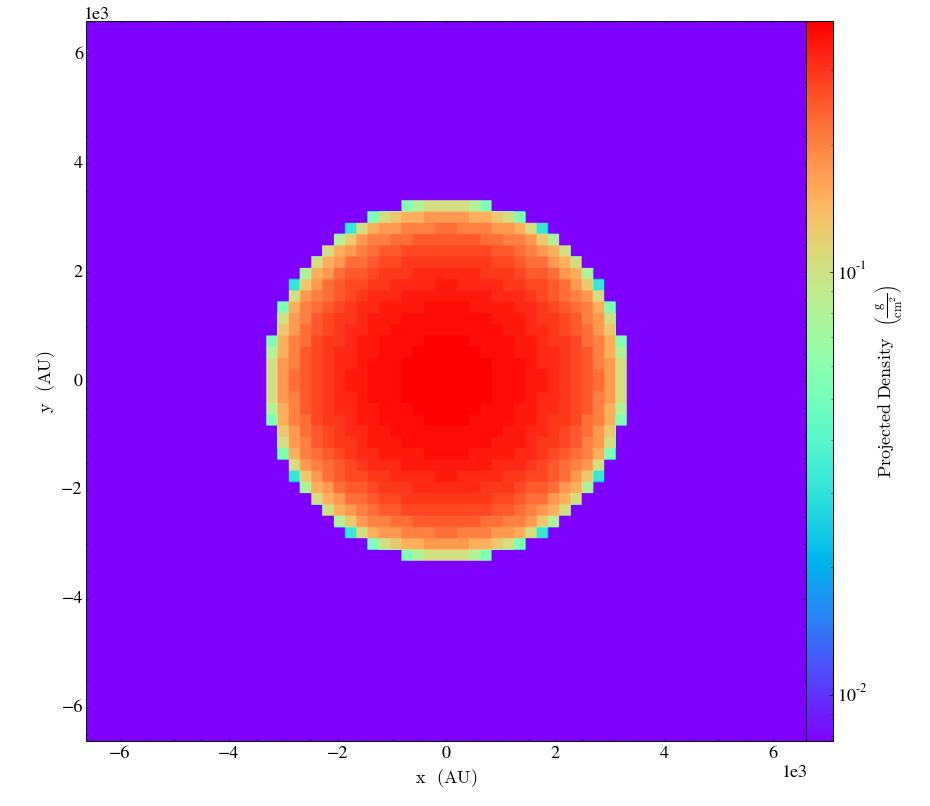


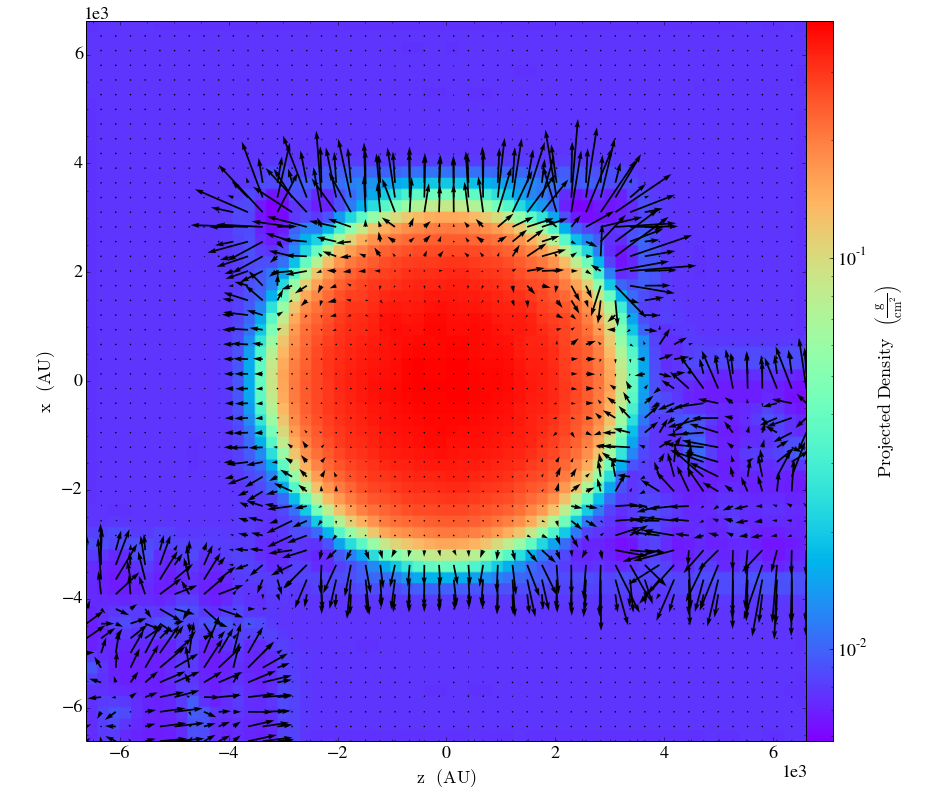

In [37]:
ds= yt.load("../../bin/coeur/output_00001/info_00001.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()
ds= yt.load("../../bin/coeur/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()

# Things crashing restarting everything


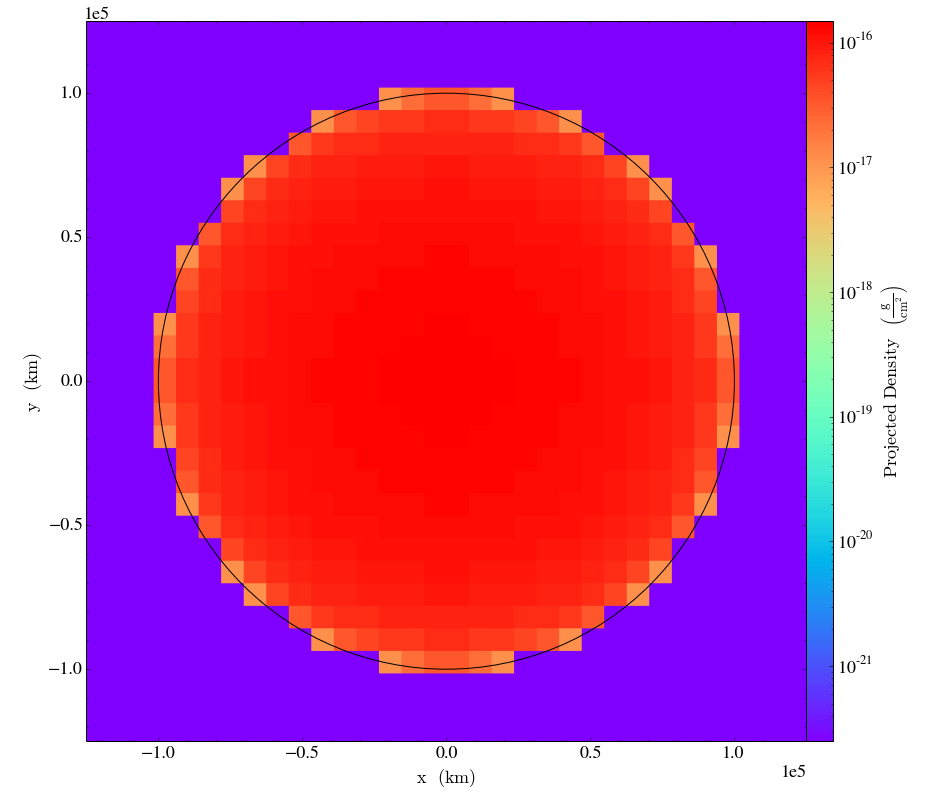


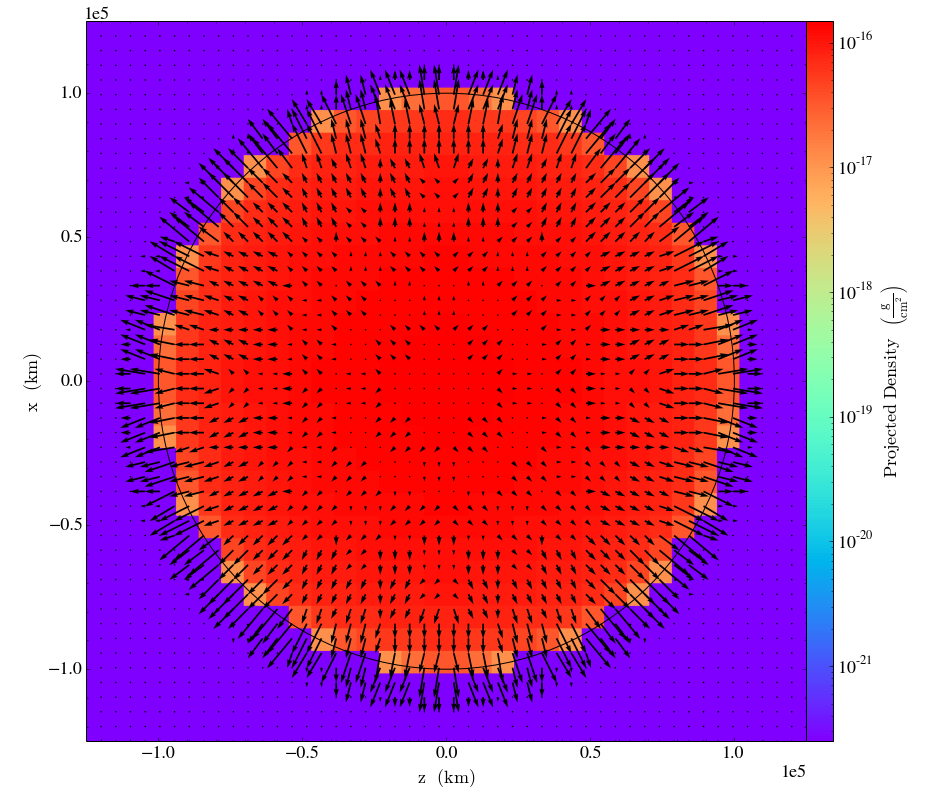

In [10]:
plot_all()


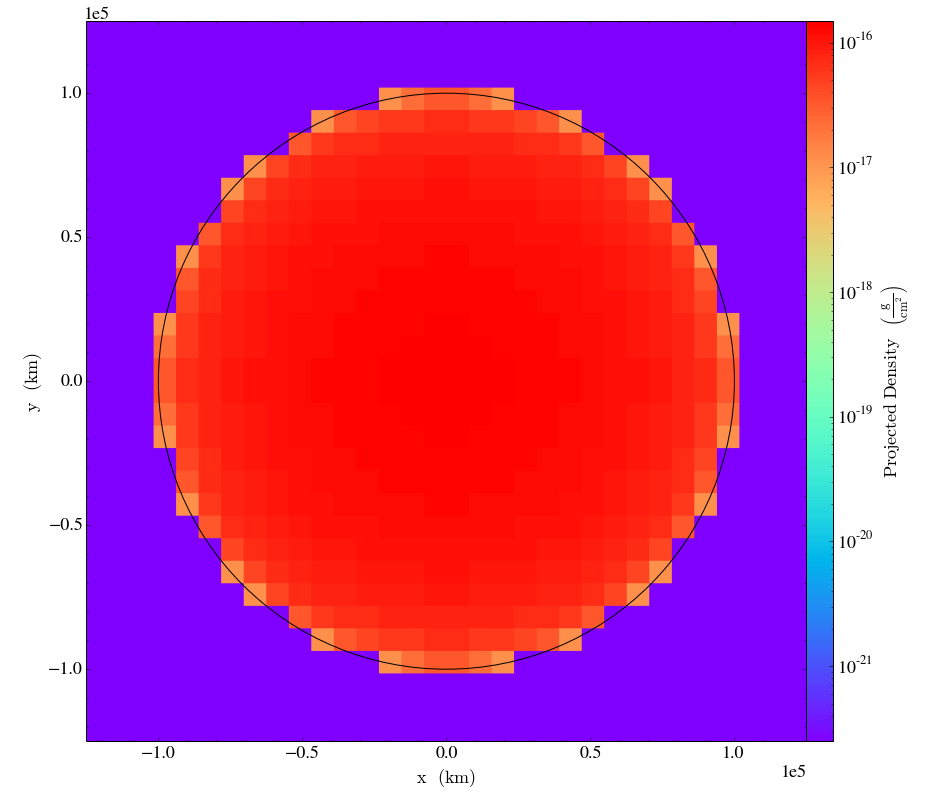


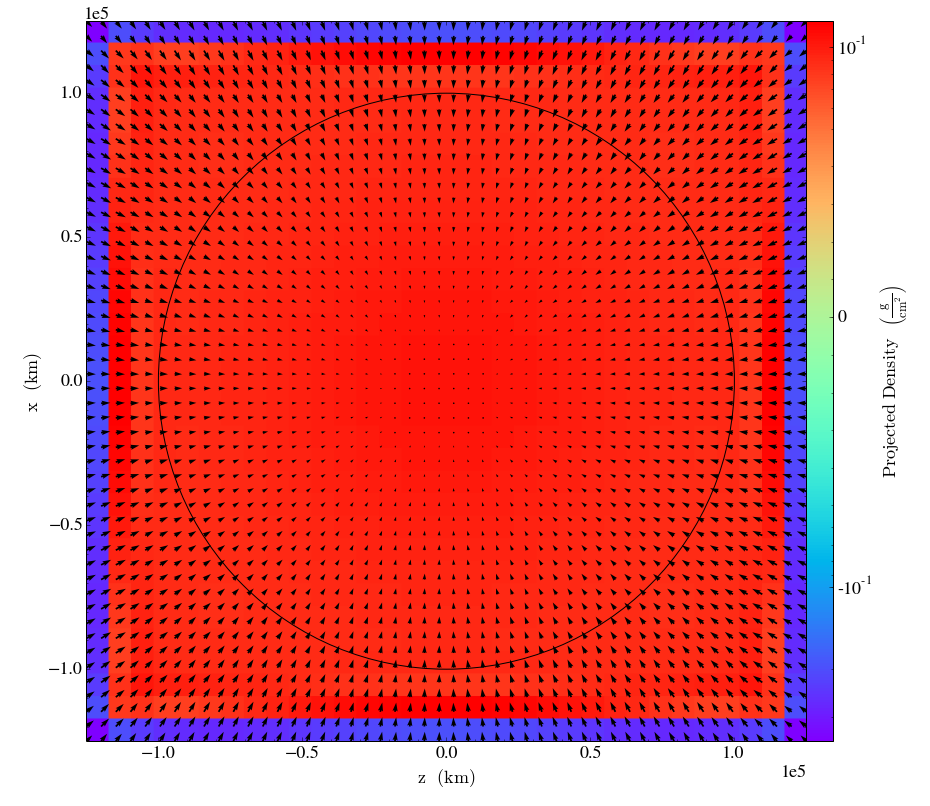

In [11]:
plot_all()

What? a collapsing cube!

With B.C custom removed, : (and increasing ngridmax)

In [25]:
ls

shell-init: error retrieving current directory: getcwd: cannot access parent directories: No such file or directory
ls: .: No such file or directory


/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:570: RuntimeWarning: divide by zero encountered in double_scalars
  length = a * (widthu_per_lenu / (self.scale * self.width))
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:570: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:626: RuntimeWarning: invalid value encountered in less
  short = np.repeat(length < minsh, 8, axis=1)
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:636: RuntimeWarning: invalid value encountered in less
  tooshort = length < self.minlength



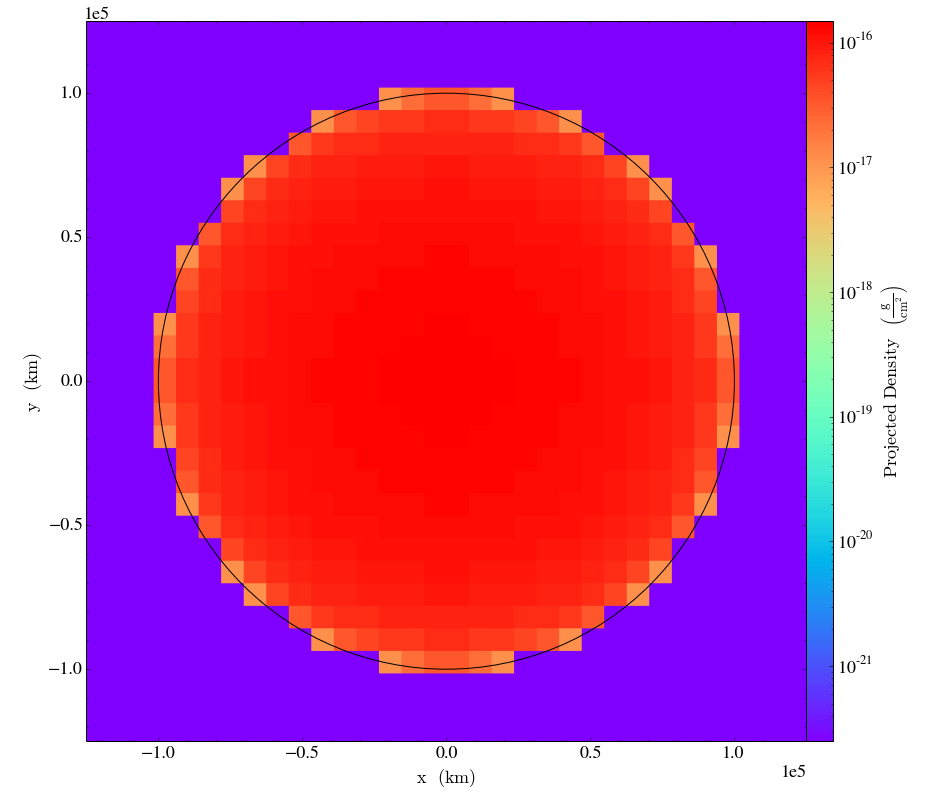


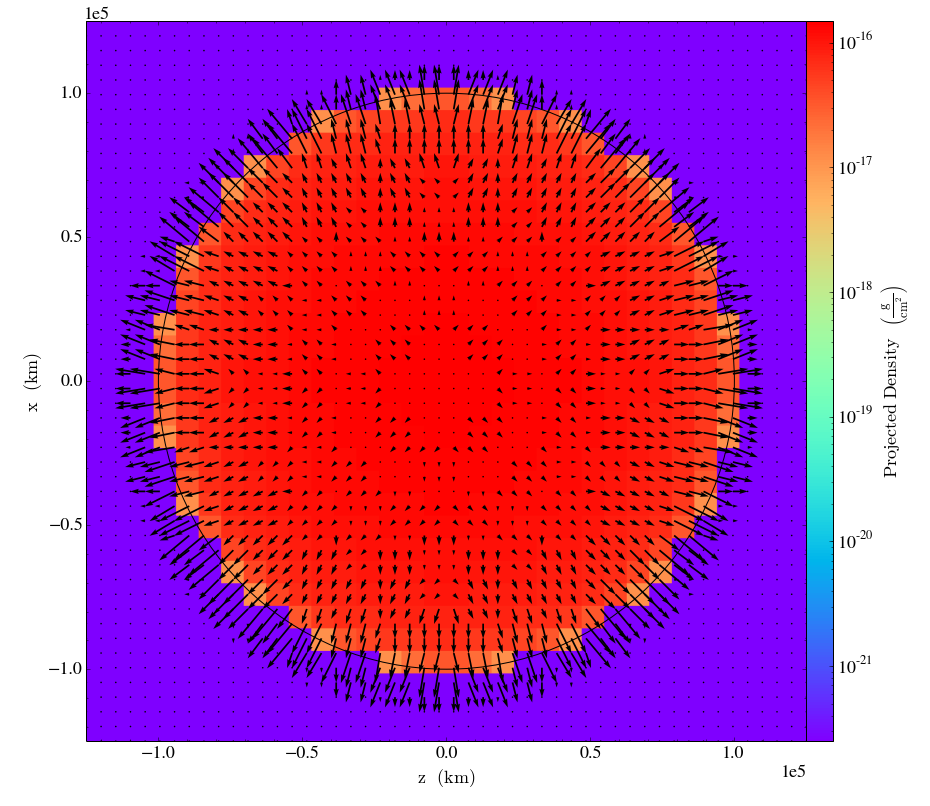

In [6]:
plot_all()

no AMR at same level

copy and paste from Mac to Linux can sometimes cause error in what "&" is encoded as. 
```
At line 510 of file ../amr/output_amr.f90 (unit = 11, file = '?Ϸ')
Fortran runtime error: File 'output_00001/header_00001.txt' does not exist
```

Using bound_type=2,2,2,2,2,2


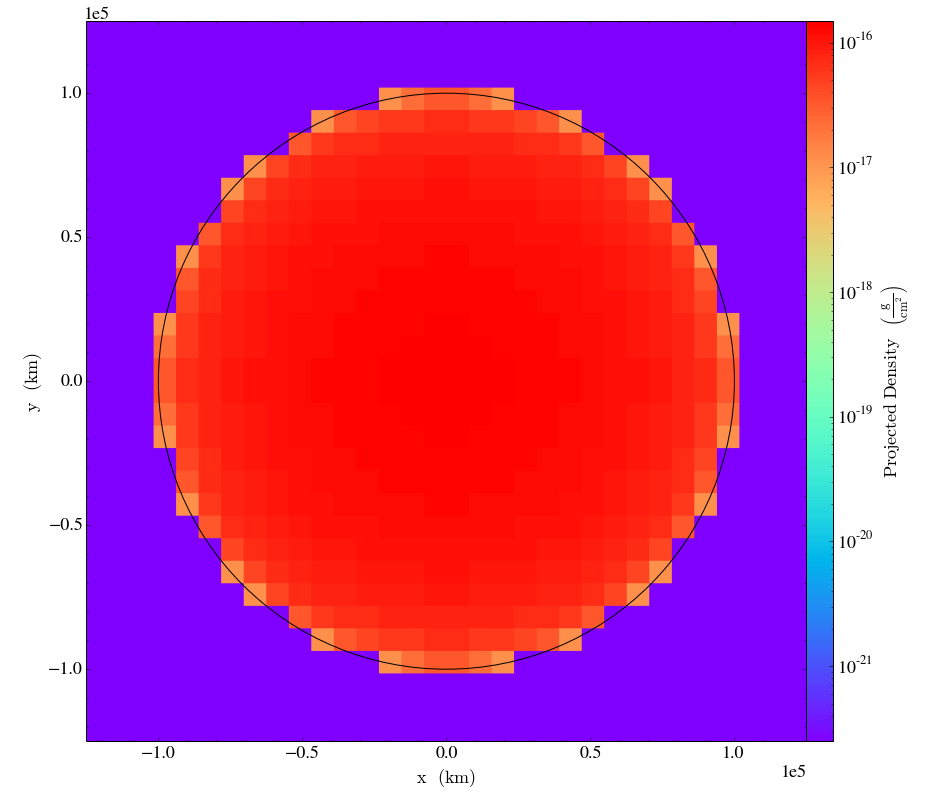


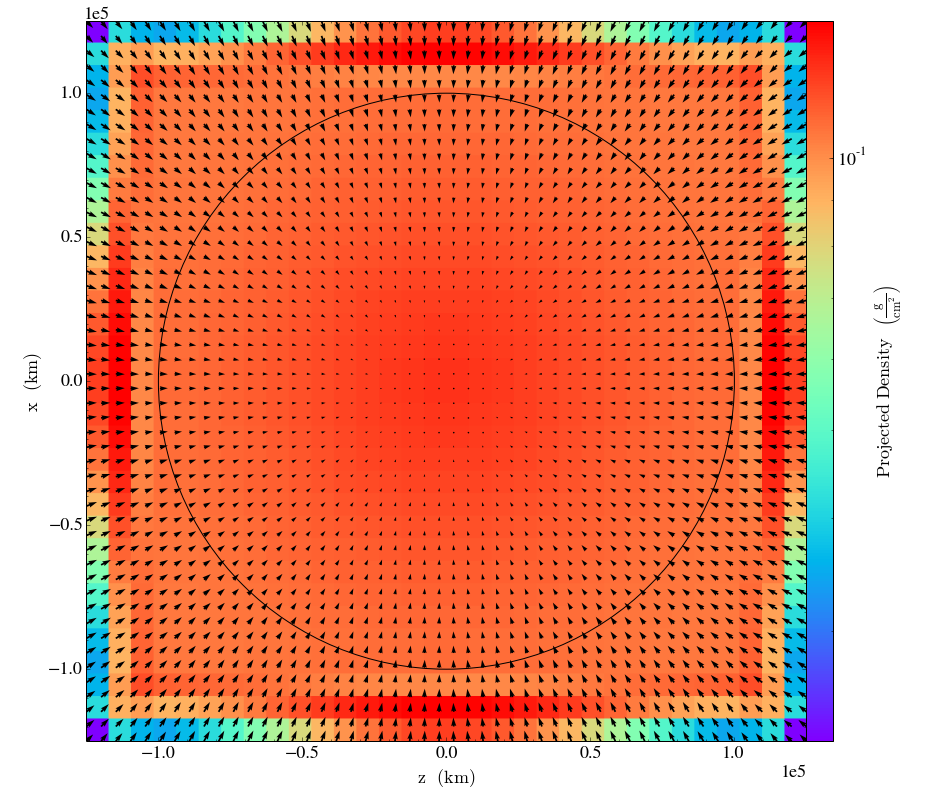

In [7]:
plot_all()

Using the custom B.C.


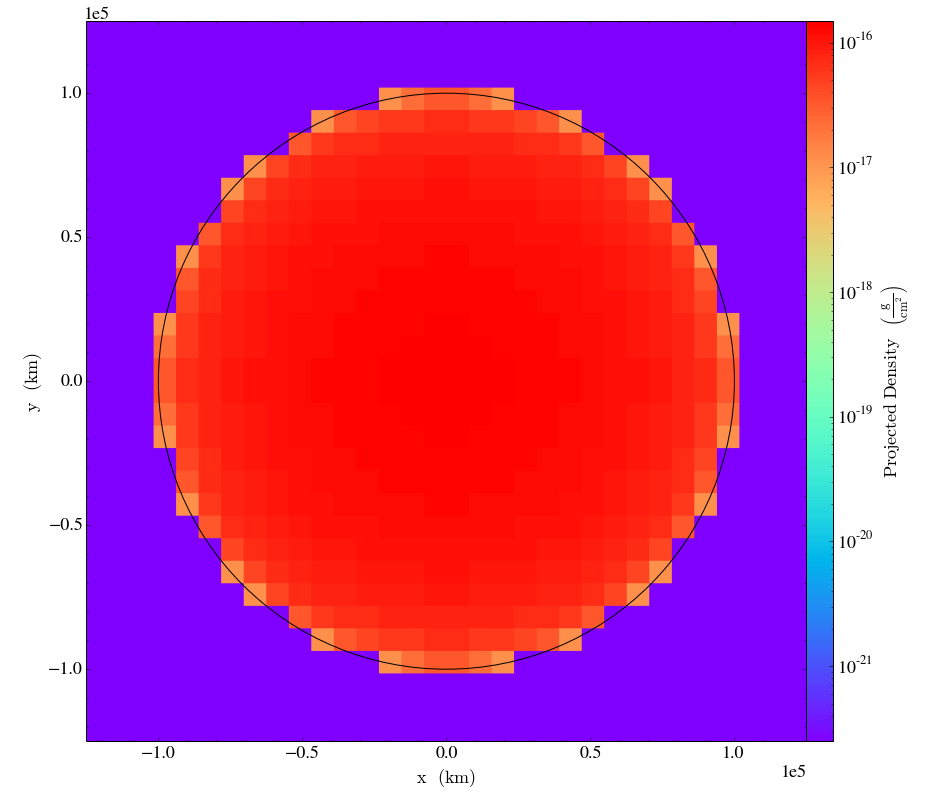


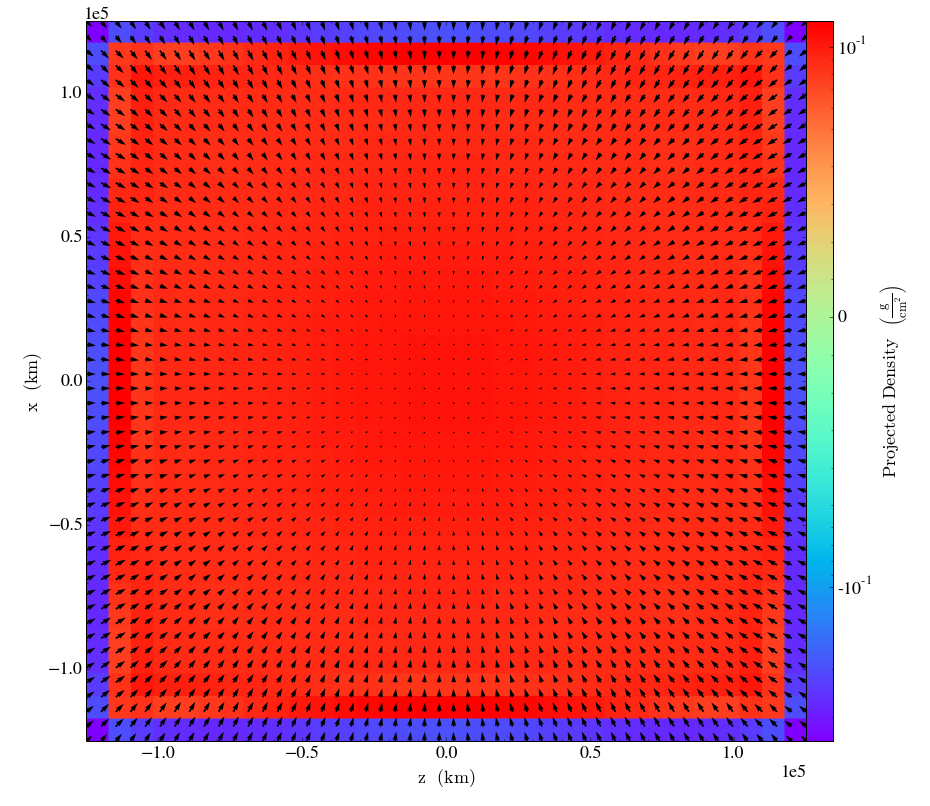

In [11]:
ds= yt.load("../../bin/output_00001/info_00001.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()

proj.show()
ds= yt.load("../../bin/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
proj.set_cmap("density","rainbow")
# proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
#                   circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()

Back to the B.C. =2


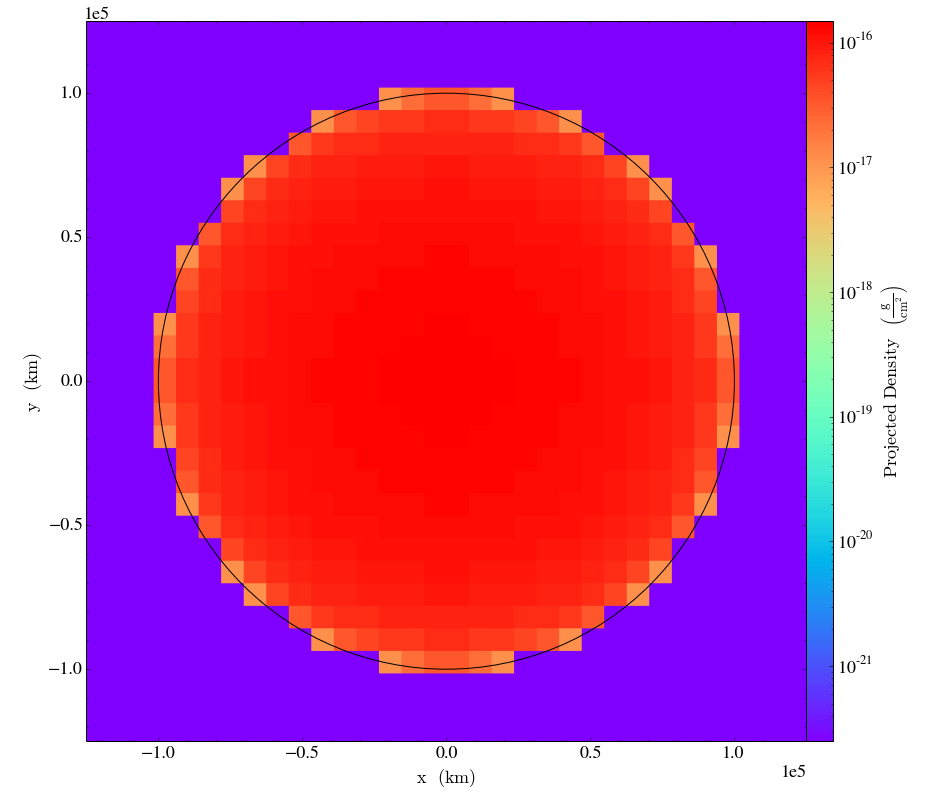


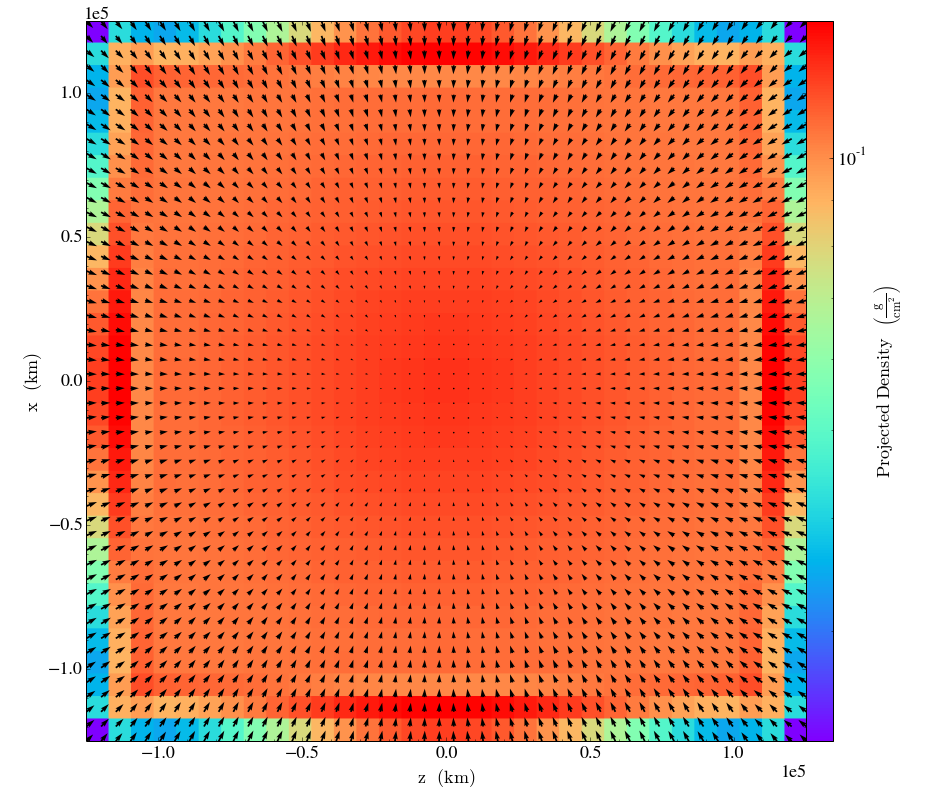

In [14]:
ds= yt.load("../../bin/output_00001/info_00001.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()

proj.show()
ds= yt.load("../../bin/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
proj.set_cmap("density","rainbow")
# proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
#                   circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()

Using no AMR, same BC=2 (above example doesn't have the WARNING anymore) 

```
No more free memory
 Increase ngridmax
```

increase order of mag --> ngridmax=100000000

still not enough memory 

so I don't have to do this' since the warning is already resolved

In [ ]:
noutput=4
tout=0.0,0.01,0.05,0.1,0.5,1

In [ ]:
Judging by the output time last time step is 6.49035E+03
tout= 1.0E3,3.0E3, 4.0E3,6.49035E+03

In [15]:
ls /Users/dorislee/Desktop/

ls: ../../bin/coeur/: No such file or directory


In [ ]:

ds= yt.load("../../bin/coeur/ output_0000{}/info_0000{}.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
# proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
#                   circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()

Changing the nstepmax to let it step more steps, no difference

Change levelmin to 3

In [12]:
plot_all()

fmt = '=d' ; length = 4 ; size= 8


RuntimeError: 

lowly resolved initial conditions, so lets do levelmin = 8

In [ ]:
plot_all()

This might be a bit too resolved and yt has trouble plotting it. (renders for a long time)

/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:570: RuntimeWarning: divide by zero encountered in double_scalars
  length = a * (widthu_per_lenu / (self.scale * self.width))
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:570: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:626: RuntimeWarning: invalid value encountered in less
  short = np.repeat(length < minsh, 8, axis=1)
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:636: RuntimeWarning: invalid value encountered in less
  tooshort = length < self.minlength



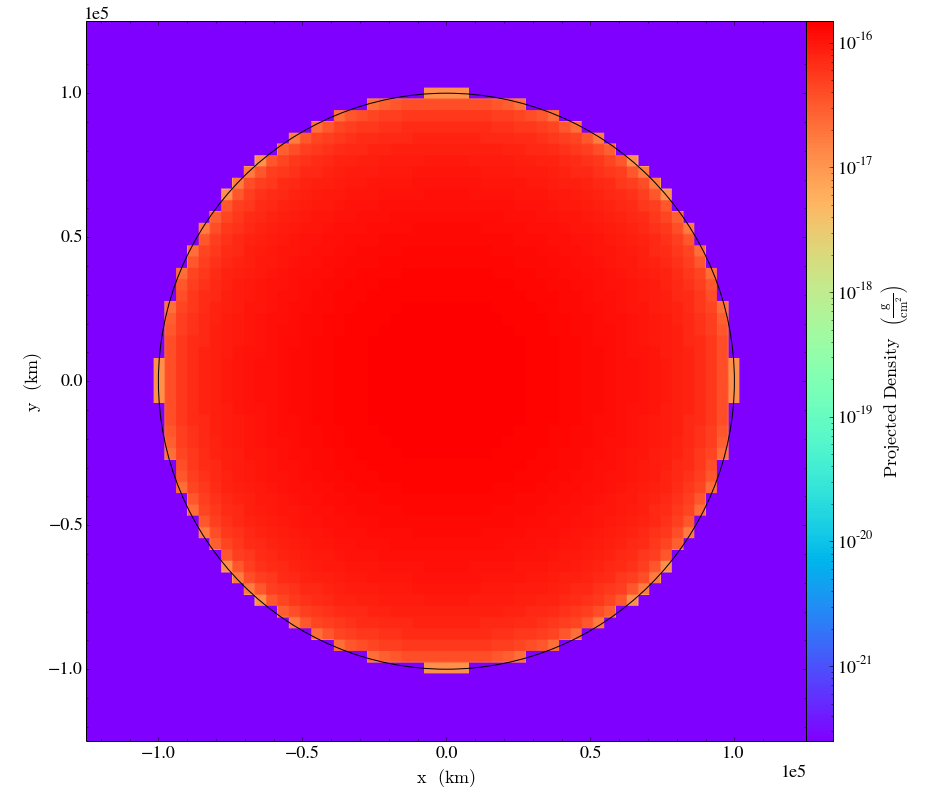

/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/colorbar.py:829: RuntimeWarning: invalid value encountered in divide
  z = np.take(y, i0) + (xn - np.take(b, i0)) * dy / db
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/colorbar.py:581: RuntimeWarning: invalid value encountered in greater
  inrange = (ticks > -0.001) & (ticks < 1.001)
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/colorbar.py:581: RuntimeWarning: invalid value encountered in less
  inrange = (ticks > -0.001) & (ticks < 1.001)



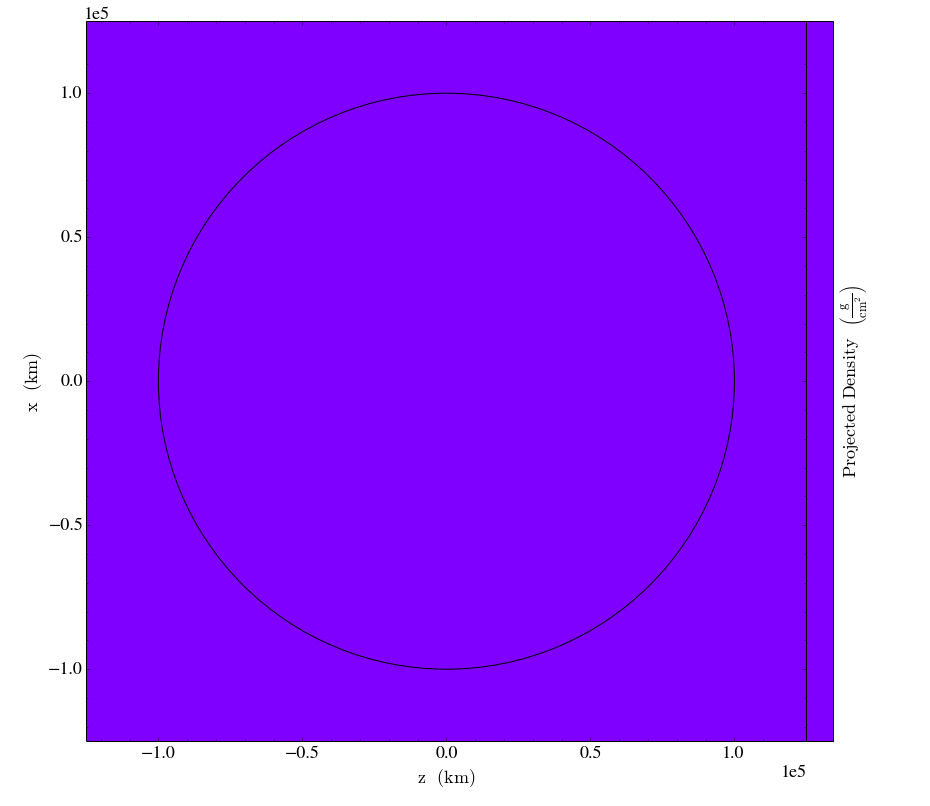

In [5]:
plot_all()

for now let's just use lev 5 to sppeeed things up'

/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:570: RuntimeWarning: divide by zero encountered in double_scalars
  length = a * (widthu_per_lenu / (self.scale * self.width))
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:570: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:626: RuntimeWarning: invalid value encountered in less
  short = np.repeat(length < minsh, 8, axis=1)
/Users/dorislee/.virtualenvs/py27dev/lib/python2.7/site-packages/matplotlib/quiver.py:636: RuntimeWarning: invalid value encountered in less
  tooshort = length < self.minlength



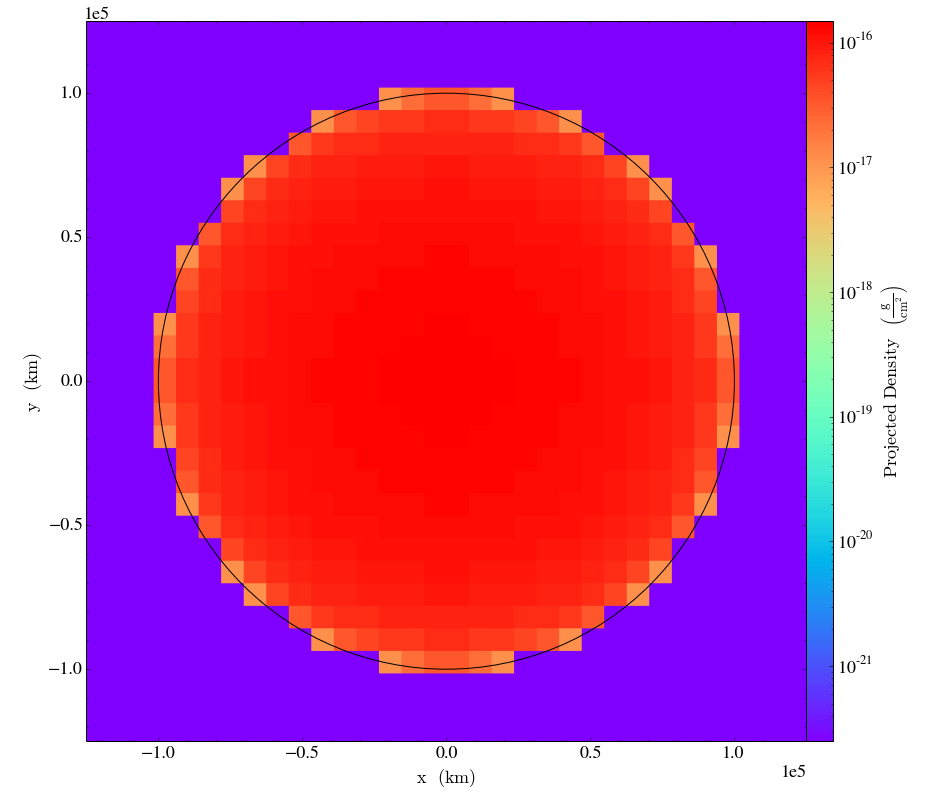


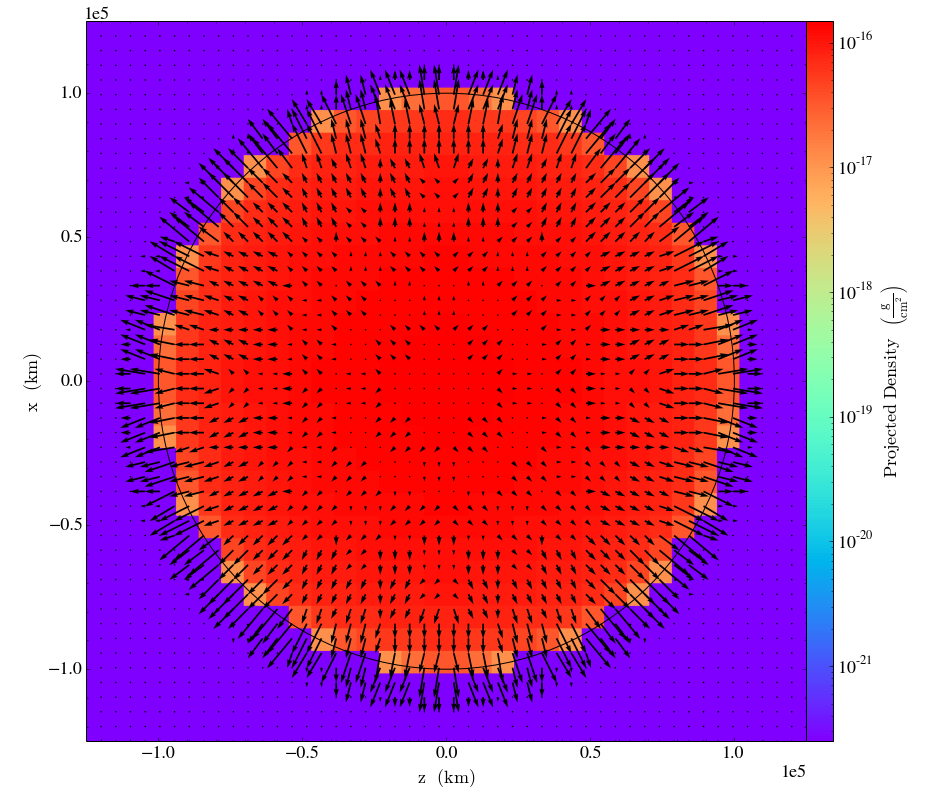

In [9]:
plot_all()

Okay from now on whenever you have this weird yt Runtim error which is like fmt = " " something just restart your ipython notebook and everything goes working again...no idea why


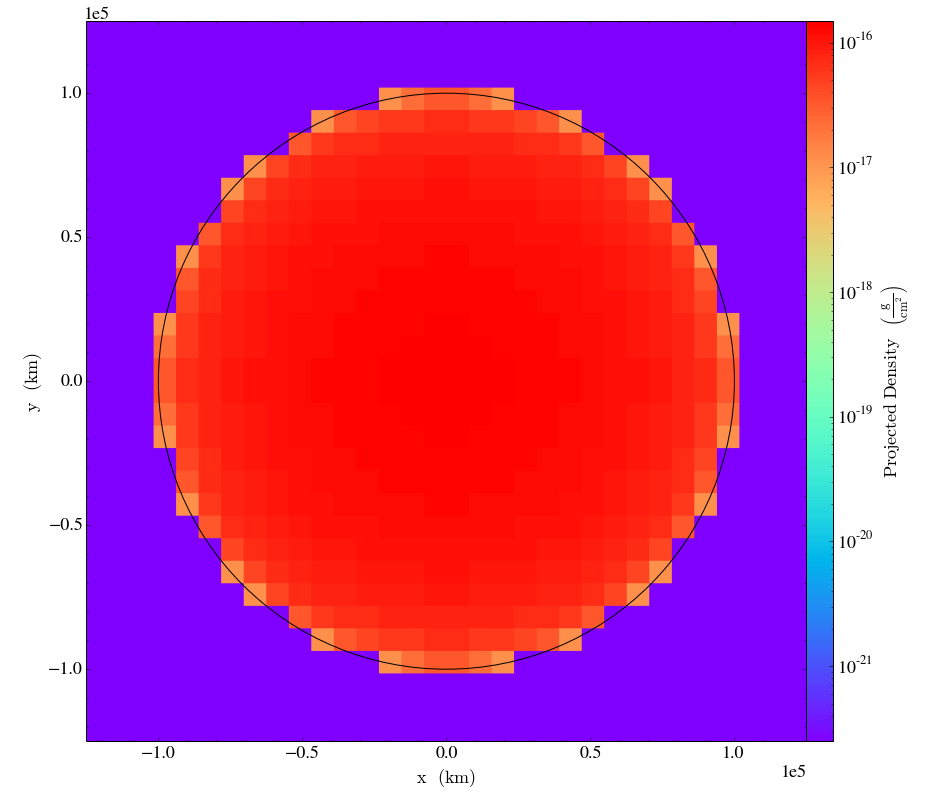


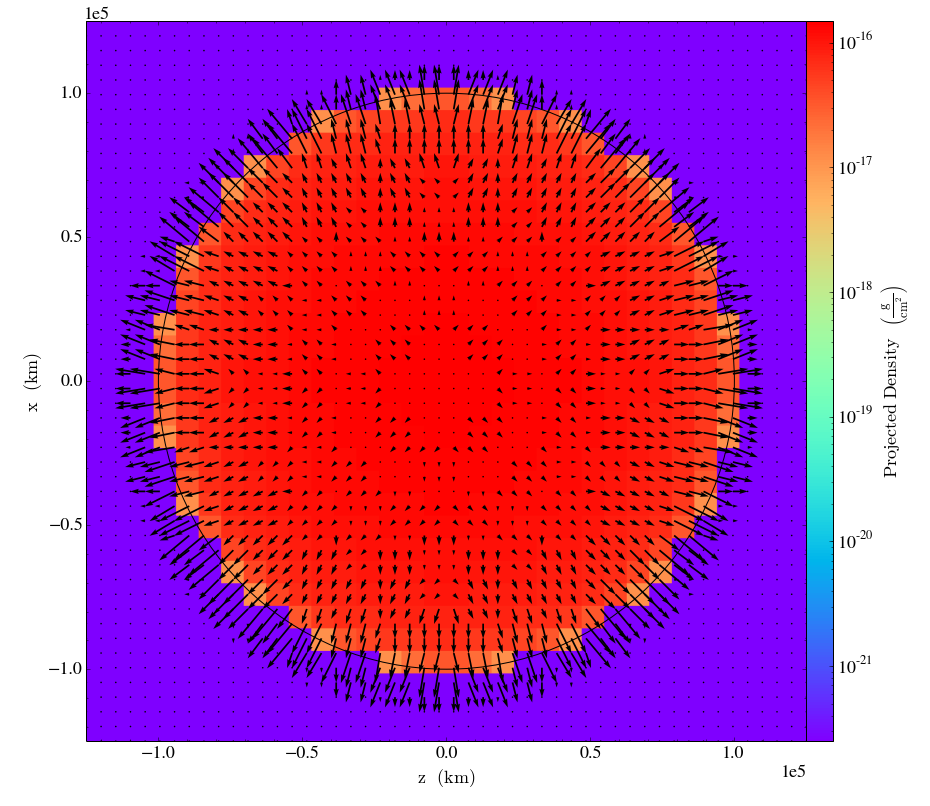

In [10]:
plot_all()


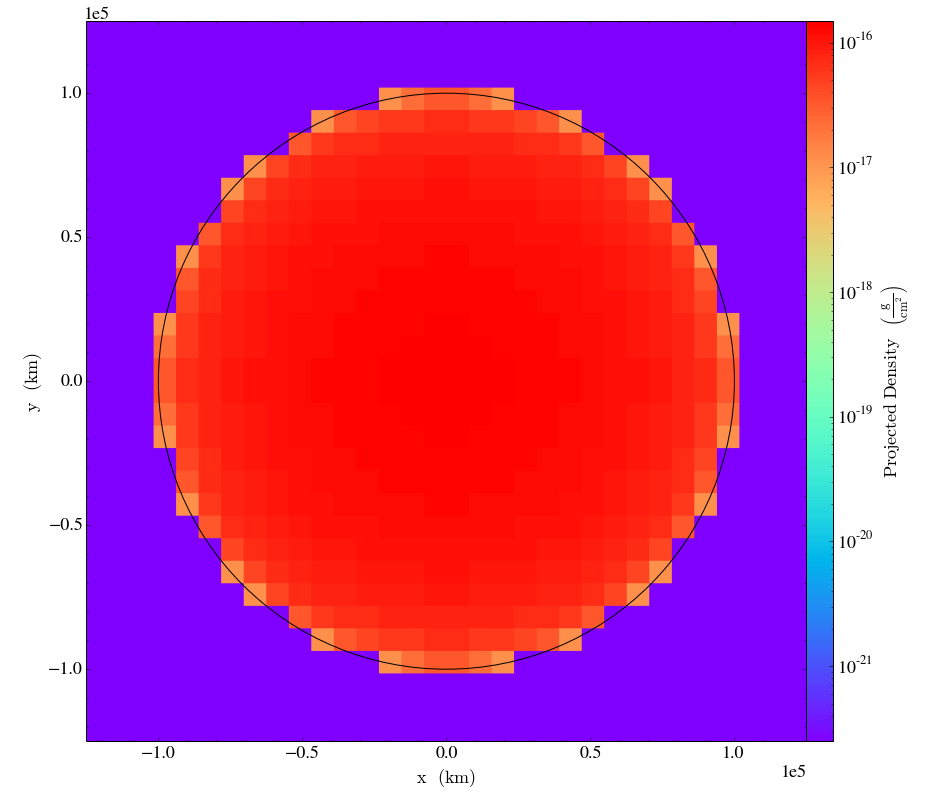


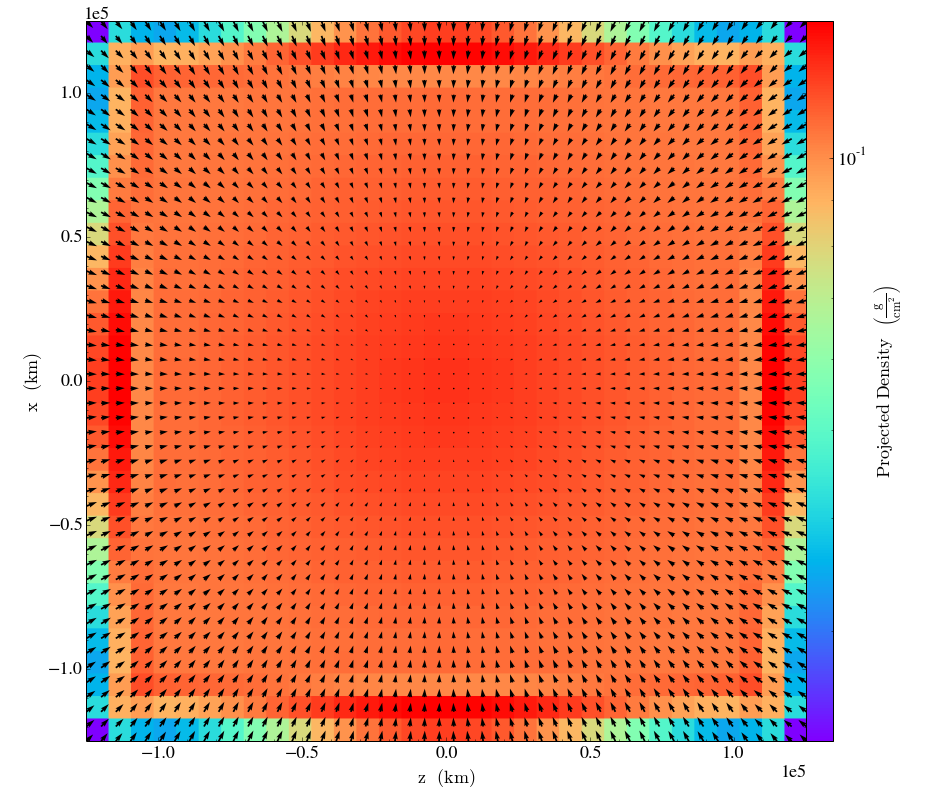

In [11]:
ds= yt.load("../../bin/output_00001/info_00001.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()

proj.show()
ds= yt.load("../../bin/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
proj.set_cmap("density","rainbow")
# proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
#                   circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()


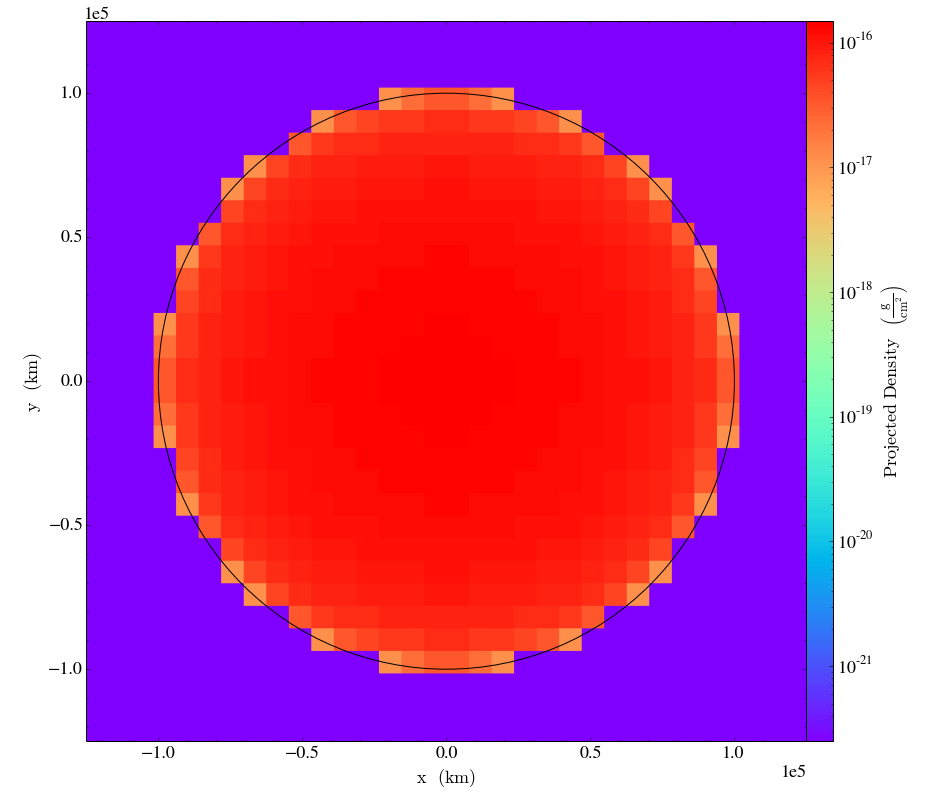


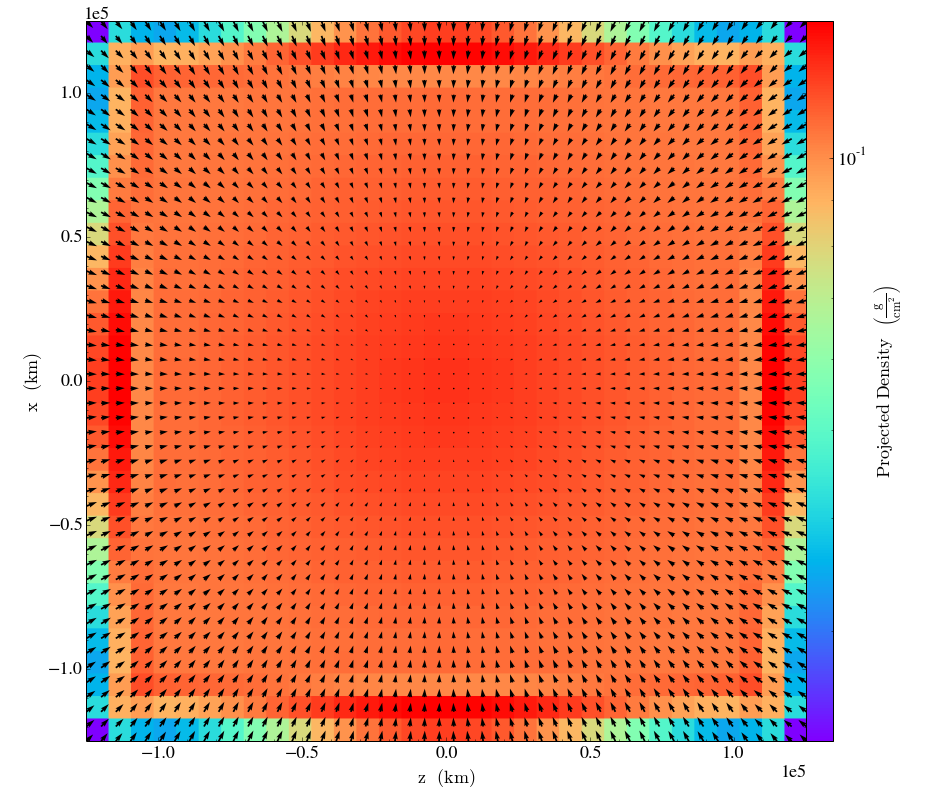

In [12]:
ds= yt.load("../../bin/output_00001/info_00001.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()

proj.show()
ds= yt.load("../../bin/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
proj.set_cmap("density","rainbow")
# proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
#                   circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()


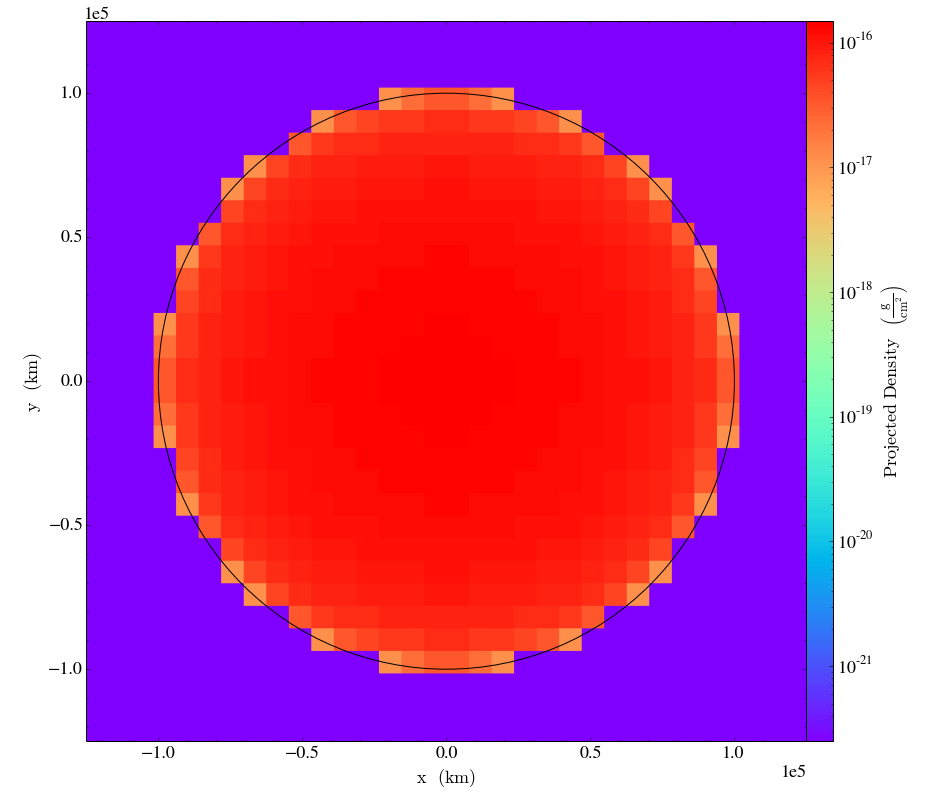


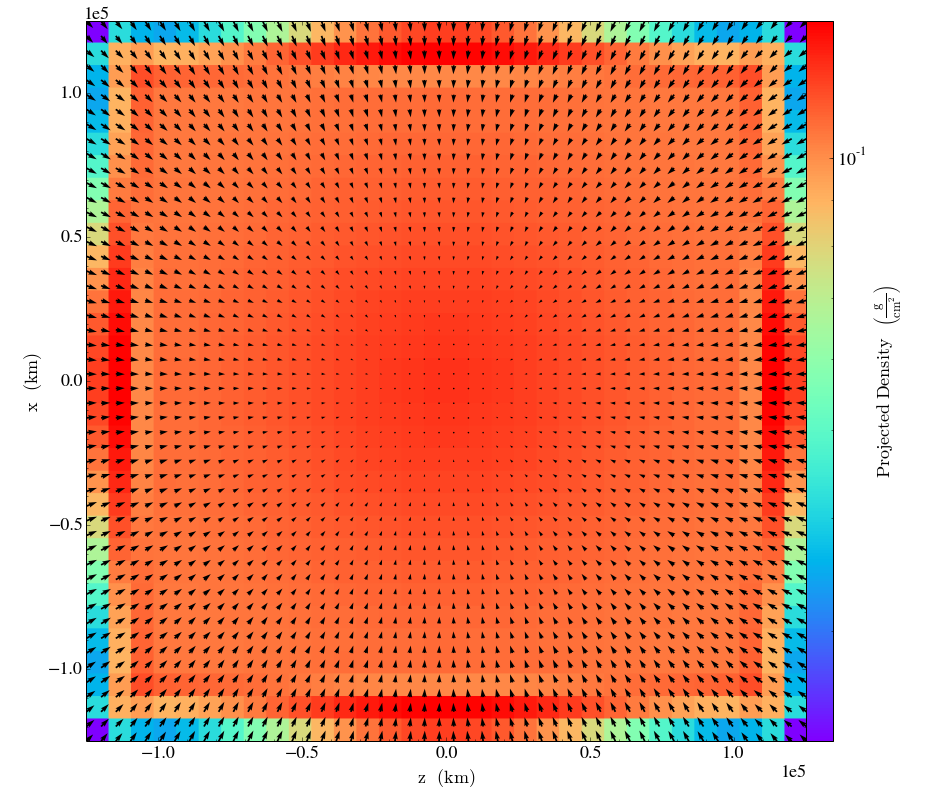

In [13]:
ds= yt.load("../../bin/output_00001/info_00001.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()

proj.show()
ds= yt.load("../../bin/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
proj.set_cmap("density","rainbow")
# proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
#                   circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()

So I realized that all the real arrays in frotran namelist have an extra comma in the back which I didn't put in ...'


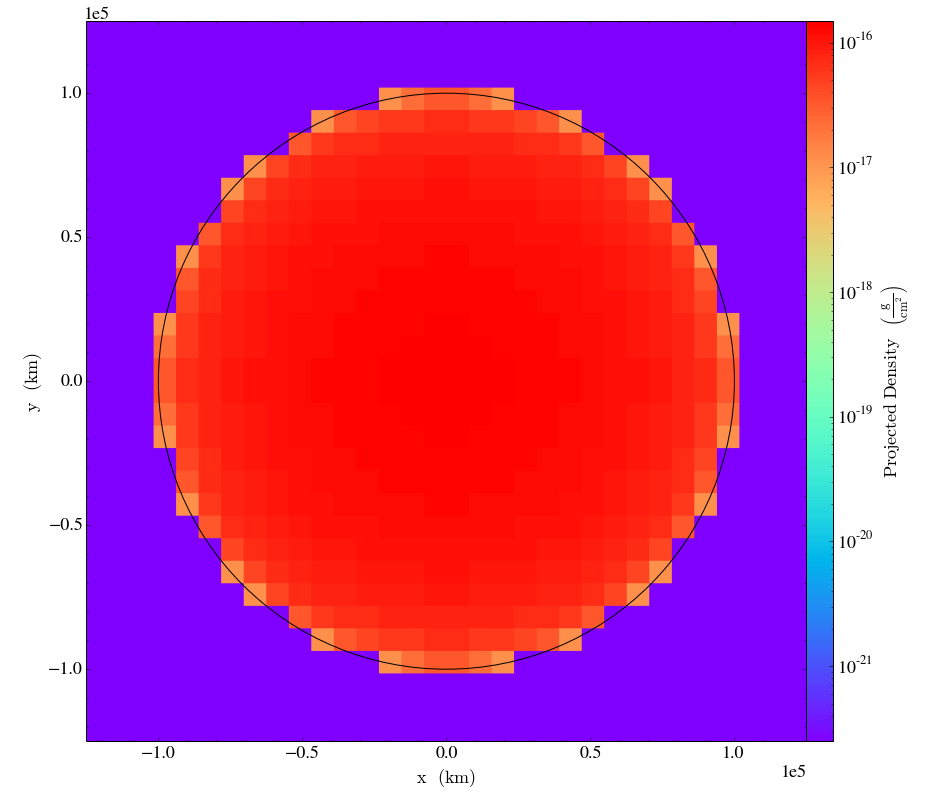


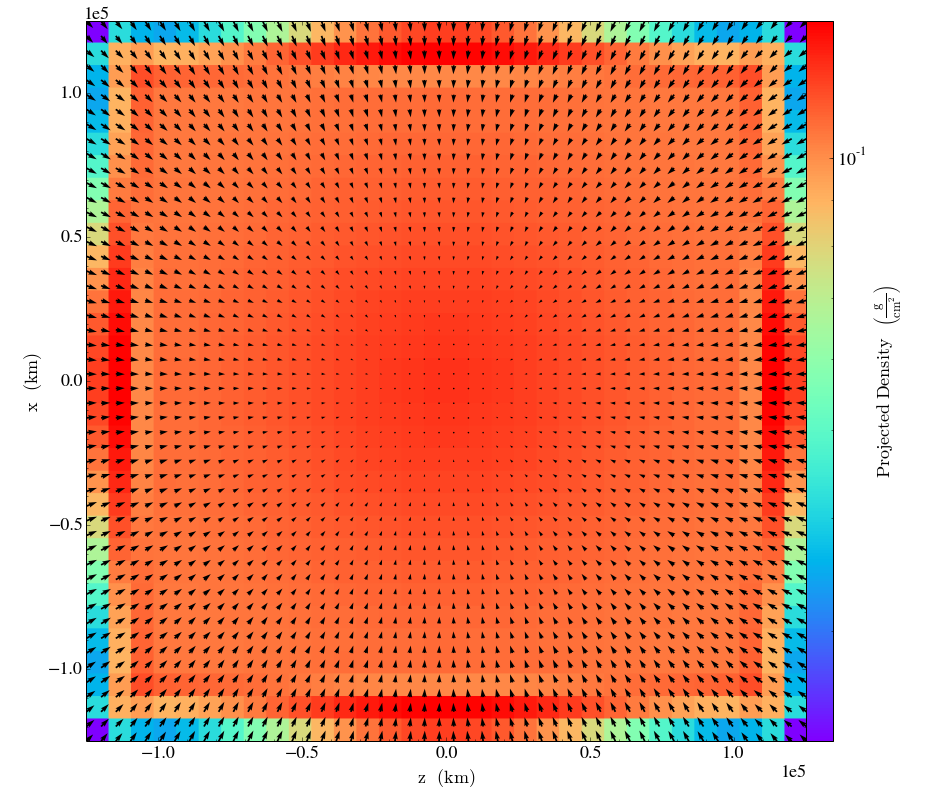

In [14]:
ds= yt.load("../../bin/output_00001/info_00001.txt")
proj = yt.ProjectionPlot(ds, "z", "density",window_size=10)
proj.set_cmap("density","rainbow")
proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
                  circle_args={'color':'black'})
proj.annotate_velocity()

proj.show()
ds= yt.load("../../bin/output_00002/info_00002.txt")
proj = yt.ProjectionPlot(ds, "y", "density",window_size=10)
proj.set_cmap("density","rainbow")
# proj.annotate_sphere([0.5, 0.5, 0.5], radius=(rmax, 'cm'),
#                   circle_args={'color':'black'})
proj.annotate_velocity()
proj.show()